In [ ]:
!pip install icecream
!pip install graphviz
! pip install rich
! pip install plantuml
! pip install spacy

#core random feature
import time
import random
from random import choice

# pretty python
from rich.table import Table
from rich.console import Console
console = Console()


#graphing libs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from google.colab import files
 
 
uploaded = files.upload()

Saving Product_details - Copy.csv to Product_details - Copy (1).csv


In [ ]:
import pandas as pd
import io
 
df = pd.read_csv(io.BytesIO(uploaded[r'Product_details - Copy.csv']))
print(df)

      Text_ID                                Product_Description  \
0        3057  The Web DesignerÛªs Guide to iOS (and Android...   
1        6254  RT @mention Line for iPad 2 is longer today th...   
2        8212  Crazy that Apple is opening a temporary store ...   
3        4422  The lesson from Google One Pass: In this digit...   
4        5526  RT @mention At the panel: &quot;Your mom has a...   
...       ...                                                ...   
6359     2945  Thanks @mention for hosting this event #sxsw #...   
6360     4528  SXSW iPhone app is awesome, but iPad app crash...   
6361     6526  RT @mention RT @mention Download 20+ free trac...   
6362     2110  OH at Texas Social Media Awards: 'You don't ne...   
6363     2177  #Google launching a &quot;major&quot; new soci...   

      Product_Type  Sentiment  
0                9          2  
1                9          2  
2                9          2  
3                9          2  
4                9     

In [ ]:
 #Import Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import string
import spacy

from matplotlib.pyplot import imread
from wordcloud import WordCloud, STOPWORDS
%matplotlib inline

In [ ]:

df=[Product_Description.strip() for Product_Description in df.Product_Description] # remove both the leading and the trailing characters
df=[Product_Description for Product_Description in df if Product_Description] # removes empty strings, because they are considered in Python as False
df[0:200]

['The Web Designer\x89Ûªs Guide to iOS (and Android) Apps, today @mention 10 a.m! {link} #sxsw',
 'RT @mention Line for iPad 2 is longer today than yesterday. #SXSW  // are you getting in line again today just for fun?',
 'Crazy that Apple is opening a temporary store in Austin tomorrow to handle the rabid #sxsw eye pad too seekers.',
 'The lesson from Google One Pass: In this digital environment, users want to purchase across every platform with one tool. #sxsw #elonsxsw',
 'RT @mention At the panel: &quot;Your mom has an ipad, designing for boomers&quot; #sxsw',
 'RT @mention I think my effing hubby is in line for an #iPad 2. Can someone point him towards the line-up for wife number #2. #sxswi #sxsw',
 '&quot;Android users are not iPhone users. (They use the Options menu, and Contextual menu)&quot; ~@mention #sxsw',
 'Wow! RT@mention We interrupt your regularly scheduled #sxsw geek programming with big news {link}  #google #circles',
 'Google to Launch New Social Network Called Circl

In [ ]:
# Joining the list into one string/text
data_Product_Description=' '.join(df)
data_Product_Description

"The Web Designer\x89Ûªs Guide to iOS (and Android) Apps, today @mention 10 a.m! {link} #sxsw RT @mention Line for iPad 2 is longer today than yesterday. #SXSW  // are you getting in line again today just for fun? Crazy that Apple is opening a temporary store in Austin tomorrow to handle the rabid #sxsw eye pad too seekers. The lesson from Google One Pass: In this digital environment, users want to purchase across every platform with one tool. #sxsw #elonsxsw RT @mention At the panel: &quot;Your mom has an ipad, designing for boomers&quot; #sxsw RT @mention I think my effing hubby is in line for an #iPad 2. Can someone point him towards the line-up for wife number #2. #sxswi #sxsw &quot;Android users are not iPhone users. (They use the Options menu, and Contextual menu)&quot; ~@mention #sxsw Wow! RT@mention We interrupt your regularly scheduled #sxsw geek programming with big news {link}  #google #circles Google to Launch New Social Network Called Circles, Possibly Today {link} {link} 

In [ ]:
# remove username handles from a given Amazon Data text. (Removes @usernames)
from nltk.tokenize import TweetTokenizer
tknzr = TweetTokenizer(strip_handles=True)
Data_tokens=tknzr.tokenize(data_Product_Description)
print(Data_tokens)

['The', 'Web', 'Designer', '\x89', 'Ûªs', 'Guide', 'to', 'iOS', '(', 'and', 'Android', ')', 'Apps', ',', 'today', '10', 'a', '.', 'm', '!', '{', 'link', '}', '#sxsw', 'RT', 'Line', 'for', 'iPad', '2', 'is', 'longer', 'today', 'than', 'yesterday', '.', '#SXSW', '/', '/', 'are', 'you', 'getting', 'in', 'line', 'again', 'today', 'just', 'for', 'fun', '?', 'Crazy', 'that', 'Apple', 'is', 'opening', 'a', 'temporary', 'store', 'in', 'Austin', 'tomorrow', 'to', 'handle', 'the', 'rabid', '#sxsw', 'eye', 'pad', 'too', 'seekers', '.', 'The', 'lesson', 'from', 'Google', 'One', 'Pass', ':', 'In', 'this', 'digital', 'environment', ',', 'users', 'want', 'to', 'purchase', 'across', 'every', 'platform', 'with', 'one', 'tool', '.', '#sxsw', '#elonsxsw', 'RT', 'At', 'the', 'panel', ':', '"', 'Your', 'mom', 'has', 'an', 'ipad', ',', 'designing', 'for', 'boomers', '"', '#sxsw', 'RT', 'I', 'think', 'my', 'effing', 'hubby', 'is', 'in', 'line', 'for', 'an', '#iPad', '2', '.', 'Can', 'someone', 'point', 'him'

In [ ]:
# Again Joining the list into one string/text
data_Product_Description=' '.join(Data_tokens)
data_Product_Description

'The Web Designer \x89 Ûªs Guide to iOS ( and Android ) Apps , today 10 a . m ! { link } #sxsw RT Line for iPad 2 is longer today than yesterday . #SXSW / / are you getting in line again today just for fun ? Crazy that Apple is opening a temporary store in Austin tomorrow to handle the rabid #sxsw eye pad too seekers . The lesson from Google One Pass : In this digital environment , users want to purchase across every platform with one tool . #sxsw #elonsxsw RT At the panel : " Your mom has an ipad , designing for boomers " #sxsw RT I think my effing hubby is in line for an #iPad 2 . Can someone point him towards the line-up for wife number # 2 . #sxswi #sxsw " Android users are not iPhone users . ( They use the Options menu , and Contextual menu ) " ~ #sxsw Wow ! RT @mention We interrupt your regularly scheduled #sxsw geek programming with big news { link } #google #circles Google to Launch New Social Network Called Circles , Possibly Today { link } { link } #SXSW #in Welcome ! Enjoy #

In [ ]:
# Remove Punctuations 
no_punc_text=data_Product_Description.translate(str.maketrans('','',string.punctuation))
no_punc_text

'The Web Designer \x89 Ûªs Guide to iOS  and Android  Apps  today 10 a  m   link  sxsw RT Line for iPad 2 is longer today than yesterday  SXSW   are you getting in line again today just for fun  Crazy that Apple is opening a temporary store in Austin tomorrow to handle the rabid sxsw eye pad too seekers  The lesson from Google One Pass  In this digital environment  users want to purchase across every platform with one tool  sxsw elonsxsw RT At the panel   Your mom has an ipad  designing for boomers  sxsw RT I think my effing hubby is in line for an iPad 2  Can someone point him towards the lineup for wife number  2  sxswi sxsw  Android users are not iPhone users   They use the Options menu  and Contextual menu    sxsw Wow  RT mention We interrupt your regularly scheduled sxsw geek programming with big news  link  google circles Google to Launch New Social Network Called Circles  Possibly Today  link   link  SXSW in Welcome  Enjoy Sxsw and ride anywhere in Austin for  10  dwnld the Grou

In [ ]:
# remove https or url within text
import re
no_url_text=re.sub(r'http\S+', '', no_punc_text)
no_url_text

'The Web Designer \x89 Ûªs Guide to iOS  and Android  Apps  today 10 a  m   link  sxsw RT Line for iPad 2 is longer today than yesterday  SXSW   are you getting in line again today just for fun  Crazy that Apple is opening a temporary store in Austin tomorrow to handle the rabid sxsw eye pad too seekers  The lesson from Google One Pass  In this digital environment  users want to purchase across every platform with one tool  sxsw elonsxsw RT At the panel   Your mom has an ipad  designing for boomers  sxsw RT I think my effing hubby is in line for an iPad 2  Can someone point him towards the lineup for wife number  2  sxswi sxsw  Android users are not iPhone users   They use the Options menu  and Contextual menu    sxsw Wow  RT mention We interrupt your regularly scheduled sxsw geek programming with big news  link  google circles Google to Launch New Social Network Called Circles  Possibly Today  link   link  SXSW in Welcome  Enjoy Sxsw and ride anywhere in Austin for  10  dwnld the Grou

In [ ]:
len(no_url_text)

601193

In [ ]:
# Normalize the data
lower_words=[Text.lower() for Text in no_url_text]
print(lower_words[100:200])

['2', ' ', 'i', 's', ' ', 'l', 'o', 'n', 'g', 'e', 'r', ' ', 't', 'o', 'd', 'a', 'y', ' ', 't', 'h', 'a', 'n', ' ', 'y', 'e', 's', 't', 'e', 'r', 'd', 'a', 'y', ' ', ' ', 's', 'x', 's', 'w', ' ', ' ', ' ', 'a', 'r', 'e', ' ', 'y', 'o', 'u', ' ', 'g', 'e', 't', 't', 'i', 'n', 'g', ' ', 'i', 'n', ' ', 'l', 'i', 'n', 'e', ' ', 'a', 'g', 'a', 'i', 'n', ' ', 't', 'o', 'd', 'a', 'y', ' ', 'j', 'u', 's', 't', ' ', 'f', 'o', 'r', ' ', 'f', 'u', 'n', ' ', ' ', 'c', 'r', 'a', 'z', 'y', ' ', 't', 'h', 'a']


In [ ]:
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.axis('off')

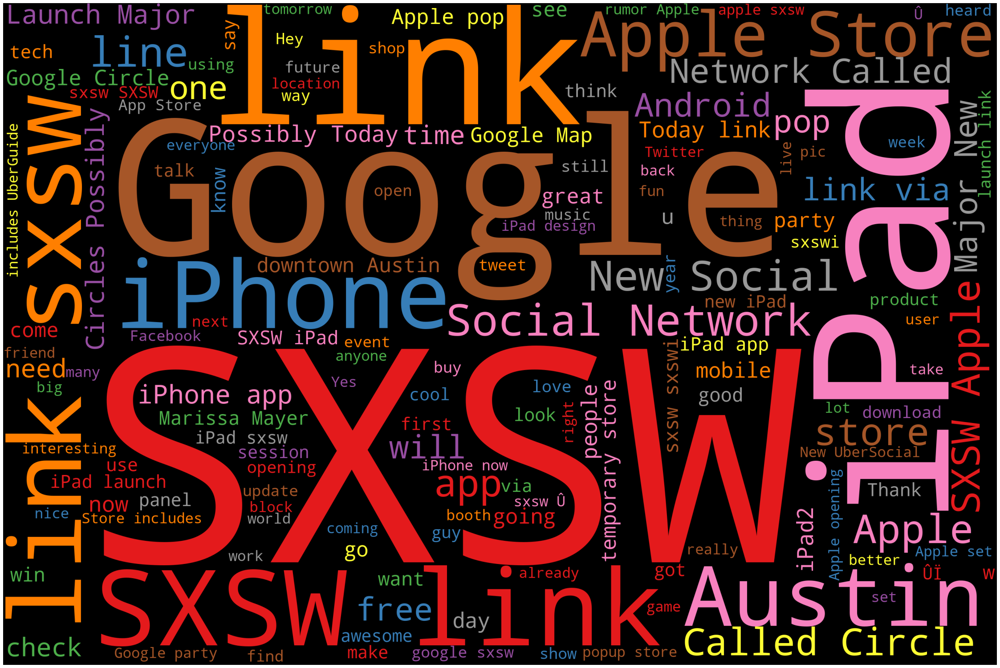

In [ ]:
# Generate Word Cloud

STOPWORDS.add('pron')
STOPWORDS.add('rt')
STOPWORDS.add('yeah')
wordcloud=WordCloud(width=3000,height=2000,background_color='black',max_words=150,
                   colormap='Set1',stopwords=STOPWORDS).generate(data_Product_Description)
plot_cloud(wordcloud)

In [ ]:
# Negative Word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(20, 10))
    plt.imshow(wordcloud)  
    plt.axis("off");

# Generate & plot wordcloud
wordcloud=WordCloud(width=2000,height=1000,background_color="Black",max_words=150,
                    colormap="Set1").generate(" ".join(df[df["Sentiment"]<=1].Product_Description))
plot_cloud(wordcloud);

TypeError: ignored

In [ ]:
# Tokenization
import nltk
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
from nltk.tokenize import word_tokenize
text_tokens=word_tokenize(no_url_text)
print(text_tokens)

['The', 'Web', 'Designer', '\x89', 'Ûªs', 'Guide', 'to', 'iOS', 'and', 'Android', 'Apps', 'today', '10', 'a', 'm', 'link', 'sxsw', 'RT', 'Line', 'for', 'iPad', '2', 'is', 'longer', 'today', 'than', 'yesterday', 'SXSW', 'are', 'you', 'getting', 'in', 'line', 'again', 'today', 'just', 'for', 'fun', 'Crazy', 'that', 'Apple', 'is', 'opening', 'a', 'temporary', 'store', 'in', 'Austin', 'tomorrow', 'to', 'handle', 'the', 'rabid', 'sxsw', 'eye', 'pad', 'too', 'seekers', 'The', 'lesson', 'from', 'Google', 'One', 'Pass', 'In', 'this', 'digital', 'environment', 'users', 'want', 'to', 'purchase', 'across', 'every', 'platform', 'with', 'one', 'tool', 'sxsw', 'elonsxsw', 'RT', 'At', 'the', 'panel', 'Your', 'mom', 'has', 'an', 'ipad', 'designing', 'for', 'boomers', 'sxsw', 'RT', 'I', 'think', 'my', 'effing', 'hubby', 'is', 'in', 'line', 'for', 'an', 'iPad', '2', 'Can', 'someone', 'point', 'him', 'towards', 'the', 'lineup', 'for', 'wife', 'number', '2', 'sxswi', 'sxsw', 'Android', 'users', 'are', 'no

In [ ]:
from nltk.tokenize import word_tokenize
text_tokens=word_tokenize(no_url_text)
#print(text_tokens)
# Tokens count
len(text_tokens)

108032

In [ ]:
# Remove Stopwords
from nltk.corpus import stopwords
my_stop_words=stopwords.words('english')

sw_list = ['\x92','rt','ye','yeah','haha','Yes','U0001F923','I','Free',"sxsw","@","rt","re","w","u","m","s","sxswi","mention","link","amp","sx","sw","wi","sxs","google","app",
                       "phone","pad","apple","austin","quot","android","ipad","marissa","mayer","social","network","store",
                       "via","popup","called","zlf","zms","quotmajorquot"]
my_stop_words.extend(sw_list)

no_stop_tokens=[word for word in text_tokens if not word in my_stop_words]
print(no_stop_tokens)

['The', 'Web', 'Designer', '\x89', 'Ûªs', 'Guide', 'iOS', 'Android', 'Apps', 'today', '10', 'RT', 'Line', 'iPad', '2', 'longer', 'today', 'yesterday', 'SXSW', 'getting', 'line', 'today', 'fun', 'Crazy', 'Apple', 'opening', 'temporary', 'Austin', 'tomorrow', 'handle', 'rabid', 'eye', 'seekers', 'The', 'lesson', 'Google', 'One', 'Pass', 'In', 'digital', 'environment', 'users', 'want', 'purchase', 'across', 'every', 'platform', 'one', 'tool', 'elonsxsw', 'RT', 'At', 'panel', 'Your', 'mom', 'designing', 'boomers', 'RT', 'think', 'effing', 'hubby', 'line', 'iPad', '2', 'Can', 'someone', 'point', 'towards', 'lineup', 'wife', 'number', '2', 'Android', 'users', 'iPhone', 'users', 'They', 'use', 'Options', 'menu', 'Contextual', 'menu', 'Wow', 'RT', 'We', 'interrupt', 'regularly', 'scheduled', 'geek', 'programming', 'big', 'news', 'circles', 'Google', 'Launch', 'New', 'Social', 'Network', 'Called', 'Circles', 'Possibly', 'Today', 'SXSW', 'Welcome', 'Enjoy', 'Sxsw', 'ride', 'anywhere', 'Austin', 

In [ ]:
# Normalize the data
lower_words=[Text.lower() for Text in no_stop_tokens]
print(lower_words[100:200])

['possibly', 'today', 'sxsw', 'welcome', 'enjoy', 'sxsw', 'ride', 'anywhere', 'austin', '10', 'dwnld', 'groundlink', 'booth', '437', 'rt', 'apple', 'plans', 'keep', 'austin', 'wired', 'opening', 'apple', 'sxsw', 'yeay', 'rt', 'new', 'ubersocial', 'iphone', 'app', 'store', 'includes', 'uberguide', 'sxsw', 'sponsored', 'masha', 'you', 'know', 'sxsw', 'season', '10', 'updates', 'whenever', 'open', 'iphone', 'rt', 'rt', 'arriving', 'us', 'looking', 'microsim', 'data', 'iphone', 'recommendations', '\x89', 'ûï', 'its', 'rumor', 'apple', 'opening', 'temporary', 'downtown', 'austin', 'sxsw', 'ipad', '2', 'launch', 'horrible', 'repressed', 'memories', 'apple', 'spinning', 'beach', 'ball', 'coming', 'back', 'progressbar', 'talk', 'saw', 'man', 'drop', 'iphone', 'gutter', 'last', 'year', 'sxsw', 'rt', 'social', 'is', 'too', 'important', 'for', 'google', 'to', 'screw', 'up', 'with', 'a', 'big', 'launch', 'circus']


In [ ]:
# Stemming (Optional)
from nltk.stem import PorterStemmer
ps=PorterStemmer()
stemmed_tokens=[ps.stem(word) for word in lower_words]
print(stemmed_tokens[100:200])

['possibl', 'today', 'sxsw', 'welcom', 'enjoy', 'sxsw', 'ride', 'anywher', 'austin', '10', 'dwnld', 'groundlink', 'booth', '437', 'rt', 'appl', 'plan', 'keep', 'austin', 'wire', 'open', 'appl', 'sxsw', 'yeay', 'rt', 'new', 'ubersoci', 'iphon', 'app', 'store', 'includ', 'uberguid', 'sxsw', 'sponsor', 'masha', 'you', 'know', 'sxsw', 'season', '10', 'updat', 'whenev', 'open', 'iphon', 'rt', 'rt', 'arriv', 'us', 'look', 'microsim', 'data', 'iphon', 'recommend', '\x89', 'ûï', 'it', 'rumor', 'appl', 'open', 'temporari', 'downtown', 'austin', 'sxsw', 'ipad', '2', 'launch', 'horribl', 'repress', 'memori', 'appl', 'spin', 'beach', 'ball', 'come', 'back', 'progressbar', 'talk', 'saw', 'man', 'drop', 'iphon', 'gutter', 'last', 'year', 'sxsw', 'rt', 'social', 'is', 'too', 'import', 'for', 'googl', 'to', 'screw', 'up', 'with', 'a', 'big', 'launch', 'circu']


In [ ]:
# Lemmatization
nlp=spacy.load('en_core_web_sm')
doc=nlp(' '.join(lower_words))
print(doc)

the web designer  ûªs guide ios android apps today 10 rt line ipad 2 longer today yesterday sxsw getting line today fun crazy apple opening temporary austin tomorrow handle rabid eye seekers the lesson google one pass in digital environment users want purchase across every platform one tool elonsxsw rt at panel your mom designing boomers rt think effing hubby line ipad 2 can someone point towards lineup wife number 2 android users iphone users they use options menu contextual menu wow rt we interrupt regularly scheduled geek programming big news circles google launch new social network called circles possibly today sxsw welcome enjoy sxsw ride anywhere austin 10 dwnld groundlink booth 437 rt apple plans keep austin wired opening apple sxsw yeay rt new ubersocial iphone app store includes uberguide sxsw sponsored masha you know sxsw season 10 updates whenever open iphone rt rt arriving us looking microsim data iphone recommendations  ûï its rumor apple opening temporary downtown austi

In [ ]:
lemmas=[token.lemma_ for token in doc]
print(lemmas)

['the', 'web', 'designer', '\x89', 'ûªs', 'guide', 'io', 'android', 'app', 'today', '10', 'rt', 'line', 'ipad', '2', 'long', 'today', 'yesterday', 'sxsw', 'get', 'line', 'today', 'fun', 'crazy', 'apple', 'open', 'temporary', 'austin', 'tomorrow', 'handle', 'rabid', 'eye', 'seeker', 'the', 'lesson', 'google', 'one', 'pass', 'in', 'digital', 'environment', 'user', 'want', 'purchase', 'across', 'every', 'platform', 'one', 'tool', 'elonsxsw', 'rt', 'at', 'panel', 'your', 'mom', 'design', 'boomer', 'rt', 'think', 'eff', 'hubby', 'line', 'ipad', '2', 'can', 'someone', 'point', 'towards', 'lineup', 'wife', 'number', '2', 'android', 'user', 'iphone', 'user', 'they', 'use', 'option', 'menu', 'contextual', 'menu', 'wow', 'rt', 'we', 'interrupt', 'regularly', 'schedule', 'geek', 'program', 'big', 'news', 'circle', 'google', 'launch', 'new', 'social', 'network', 'call', 'circle', 'possibly', 'today', 'sxsw', 'welcome', 'enjoy', 'sxsw', 'ride', 'anywhere', 'austin', '10', 'dwnld', 'groundlink', 'bo

In [ ]:
clean_tweets=' '.join(lemmas)
clean_tweets

'the web designer \x89 ûªs guide io android app today 10 rt line ipad 2 long today yesterday sxsw get line today fun crazy apple open temporary austin tomorrow handle rabid eye seeker the lesson google one pass in digital environment user want purchase across every platform one tool elonsxsw rt at panel your mom design boomer rt think eff hubby line ipad 2 can someone point towards lineup wife number 2 android user iphone user they use option menu contextual menu wow rt we interrupt regularly schedule geek program big news circle google launch new social network call circle possibly today sxsw welcome enjoy sxsw ride anywhere austin 10 dwnld groundlink booth 437 rt apple plan keep austin wire open apple sxsw yeay rt new ubersocial iphone app store include uberguide sxsw sponsor masha you know sxsw season 10 update whenever open iphone rt rt arrive we look microsim datum iphone recommendation \x89 ûï its rumor apple open temporary downtown austin sxsw ipad 2 launch horrible repressed me

In [ ]:
#COUNT VECTORIZER
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()
tweetscv=cv.fit_transform(lemmas)

In [ ]:
print(cv.get_feature_names()[100:200])

['245', '24587', '247', '25', '25000', '250k', '268', '27', '270', '2b', '2day', '2h', '2honor', '2it', '2moro', '2nd', '2nite', '2rd', '2s', '2wk', '2wks', '2x', '2yr', '2yrs', '2åê', '30', '300', '3000', '3045', '30k', '30min', '30mio', '30th', '31', '310', '310409h2011', '311', '312', '313', '314', '315', '317', '318', '319', '32', '320', '32000', '322', '33', '330', '339', '34', '345', '35', '350', '359', '36', '360', '360idev', '37', '38', '3blks', '3d', '3gs', '3k', '3rd', '3x', '40', '400', '40min', '41', '420', '43', '430', '437', '44', '445', '45', '450', '47', '48', '4999', '4android', '4chan', '4chan4eva', '4hb', '4sq', '4sq3', '4sqchat', '4sqs', '4square', '4sqwill', '4th', '4this', '4thought', '50', '500', '5000', '504', '506']


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
print(tweetscv.toarray()[100:200])

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [ ]:
cv_ngram_range=CountVectorizer(analyzer='word',ngram_range=(1,3),max_features=100)
bow_matrix_ngram=cv_ngram_range.fit_transform(lemmas)

In [ ]:
print(cv_ngram_range.get_feature_names())
print(bow_matrix_ngram.toarray())

['android', 'app', 'apple', 'around', 'at', 'austin', 'awesome', 'be', 'big', 'buy', 'call', 'can', 'check', 'circle', 'come', 'cool', 'day', 'design', 'do', 'download', 'downtown', 'find', 'first', 'free', 'game', 'get', 'give', 'go', 'good', 'google', 'great', 'guy', 'if', 'ipad', 'ipad2', 'iphone', 'its', 'just', 'know', 'launch', 'like', 'line', 'look', 'love', 'major', 'make', 'map', 'marissa', 'mayer', 'mobile', 'music', 'need', 'network', 'new', 'news', 'next', 'not', 'one', 'open', 'panel', 'party', 'people', 'pop', 'possibly', 'product', 're', 'rt', 'rumor', 'say', 'search', 'see', 'sell', 'set', 'shop', 'show', 'social', 'store', 'sxsw', 'sxswi', 'take', 'talk', 'tech', 'temporary', 'thank', 'the', 'think', 'time', 'today', 'tweet', 'update', 'use', 'user', 'want', 'we', 'well', 'what', 'win', 'year', 'you', 'ûï']
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [ ]:
print(cv_ngram_range.get_feature_names())
print(bow_matrix_ngram.toarray())

['android', 'app', 'apple', 'around', 'at', 'austin', 'awesome', 'be', 'big', 'buy', 'call', 'can', 'check', 'circle', 'come', 'cool', 'day', 'design', 'do', 'download', 'downtown', 'find', 'first', 'free', 'game', 'get', 'give', 'go', 'good', 'google', 'great', 'guy', 'if', 'ipad', 'ipad2', 'iphone', 'its', 'just', 'know', 'launch', 'like', 'line', 'look', 'love', 'major', 'make', 'map', 'marissa', 'mayer', 'mobile', 'music', 'need', 'network', 'new', 'news', 'next', 'not', 'one', 'open', 'panel', 'party', 'people', 'pop', 'possibly', 'product', 're', 'rt', 'rumor', 'say', 'search', 'see', 'sell', 'set', 'shop', 'show', 'social', 'store', 'sxsw', 'sxswi', 'take', 'talk', 'tech', 'temporary', 'thank', 'the', 'think', 'time', 'today', 'tweet', 'update', 'use', 'user', 'want', 'we', 'well', 'what', 'win', 'year', 'you', 'ûï']
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidfv_ngram_max_features=TfidfVectorizer(norm='l2',analyzer='word',ngram_range=(1,3),max_features=500)
tfidf_matix_ngram=tfidfv_ngram_max_features.fit_transform(lemmas)

In [ ]:
print(tfidfv_ngram_max_features.get_feature_names())
print(tfidf_matix_ngram.toarray())

['10', '11', '150', '1st', '20', '2011', '2s', '40', '59p', '6th', '80', 'able', 'access', 'aclu', 'action', 'actually', 'all', 'already', 'also', 'amazing', 'and', 'android', 'announce', 'another', 'any', 'anyone', 'anything', 'app', 'apple', 'around', 'art', 'artist', 'ask', 'at', 'attend', 'attendee', 'austin', 'available', 'award', 'away', 'awesome', 'back', 'bad', 'ballroom', 'band', 'bar', 'base', 'battery', 'be', 'before', 'begin', 'big', 'bing', 'blackberry', 'block', 'blog', 'book', 'booth', 'brain', 'brand', 'brilliant', 'bring', 'build', 'business', 'but', 'buy', 'buzz', 'call', 'camera', 'can', 'card', 'case', 'cc', 'center', 'chance', 'change', 'charge', 'charger', 'check', 'checkin', 'choice', 'circle', 'cnet', 'cnn', 'code', 'come', 'company', 'conference', 'congress', 'connect', 'cont', 'content', 'convention', 'cool', 'core', 'could', 'create', 'crowd', 'daily', 'datum', 'day', 'demo', 'design', 'designing', 'detail', 'developer', 'device', 'digital', 'discovery', 'do'

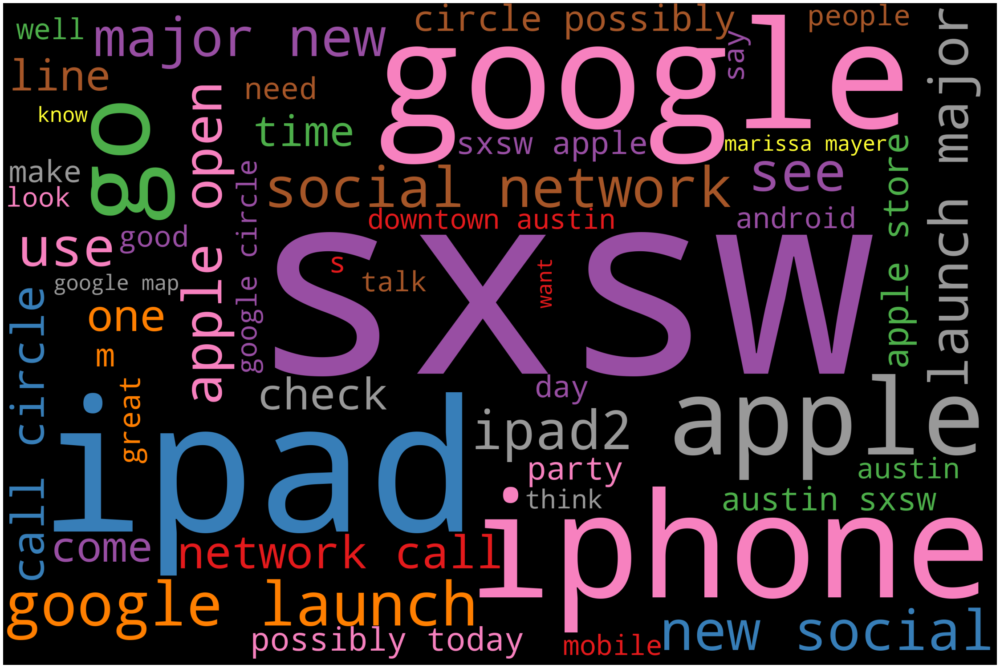

In [ ]:
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.axis('off')
    
# Generate Word Cloud

STOPWORDS.add('pron')
STOPWORDS.add('rt')
STOPWORDS.add('yeah')
wordcloud=WordCloud(width=3000,height=2000,background_color='black',max_words=50,
                   colormap='Set1',stopwords=STOPWORDS).generate(clean_tweets)
plot_cloud(wordcloud)

In [ ]:
# Negative Word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(20, 10))
    plt.imshow(wordcloud)  
    plt.axis("off");
    
# Generate & plot wordcloud
wordcloud=WordCloud(width=2000,height=1000,background_color="Black",max_words=150,
                    colormap="Set1").generate(" ".join(df[df["Sentiment"]<=1].Product_Description))
plot_cloud(wordcloud);

TypeError: ignored

In [ ]:
# Parts Of Speech (POS) Tagging
nlp=spacy.load('en_core_web_sm')

one_block=clean_tweets
doc_block=nlp(one_block)
spacy.displacy.render(doc_block,style='ent',jupyter=True)

In [ ]:
for token in doc_block[100:200]:
    print(token,token.pos_) 

possibly ADV
today NOUN
sxsw PROPN
welcome NOUN
enjoy VERB
sxsw PROPN
ride VERB
anywhere ADV
austin PROPN
10 NUM
dwnld NOUN
groundlink NOUN
booth PROPN
437 NUM
rt PROPN
apple NOUN
plan NOUN
keep VERB
austin NOUN
wire NOUN
open ADJ
apple PROPN
sxsw PROPN
yeay PROPN
rt PROPN
new ADJ
ubersocial ADJ
iphone NOUN
app NOUN
store NOUN
include VERB
uberguide ADJ
sxsw PROPN
sponsor NOUN
masha PROPN
you PRON
know VERB
sxsw PROPN
season NOUN
10 NUM
update NOUN
whenever SCONJ
open ADJ
iphone NOUN
rt PROPN
rt PROPN
arrive PROPN
we PRON
look VERB
microsim PROPN
datum PROPN
iphone NOUN
recommendation NOUN
 NOUN
ûï ADP
its PRON
rumor NOUN
apple NOUN
open ADJ
temporary ADJ
downtown NOUN
austin NOUN
sxsw PROPN
ipad PROPN
2 PROPN
launch NOUN
horrible ADJ
repressed ADJ
memory NOUN
apple NOUN
spinning VERB
beach NOUN
ball NOUN
come VERB
back ADV
progressbar NOUN
talk NOUN
see VERB
man NOUN
drop VERB
iphone NOUN
gutter NOUN
last ADJ
year NOUN
sxsw PROPN
rt PROPN
social PROPN
be AUX
too ADV
important ADJ
for

In [ ]:
# Filtering the nouns and verbs only
nouns_verbs=[token.text for token in doc_block if token.pos_ in ('NOUN','VERB')]
print(nouns_verbs[100:200])

['iphone', 'gutter', 'year', 'screw', 'launch', 'circus', 'day', 'business', 'apple', 'appear', 'trend', 'enjoy', 'music', 'sampler', 'itune', 'enchantment', 'sell', 'dream', 'job', 'say', 'iphone', 'part', 't', 'make', 'thank', 'publishing', 'tomorrow', 'speak', 'chromeo', 'exhibit', 'hall', 'pm', 'ipad', 'hand', 'dude', 'give', 'hour', 'line', 'win', 'shop', 'do', 'iphone', 'thank', 'make', 'event', 'appear', 'work', 'tweet', 'register', 'pass', 'event', 'ipad', 'give', 'cont', 'travel', 'win', 'webdoccom', 'tech', 'ouch', 'google', 'bing', 'respect', 'bing', 'guy', 'invite', 'fill', 'chair', 'rt', 'thing', 'hear', 'wknd', 'give', 'money', 'relief', 'need', 'ipad', 'austin', 'get', 'tell', 'iphone', 'brick', 'crowd', 'report', 'scene', 'song', 'download', 'feature', 'album', 'feature', 'mix', 'itune', 'recommendation', 'engine', 'session', 'thank', 'pandora', 'youtube', 'stumbledupon', 'couple', 'evo']


In [ ]:
# Counting the noun & verb tokens
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()

X=cv.fit_transform(nouns_verbs)
sum_words=X.sum(axis=0)

words_freq=[(word,sum_words[0,idx]) for word,idx in cv.vocabulary_.items()]
words_freq=sorted(words_freq, key=lambda x: x[1], reverse=True)

wd_df=pd.DataFrame(words_freq)
wd_df.columns=['word','count']
wd_df[0:10] # viewing top ten results

,word,count
0,ipad,1165
1,iphone,907
2,apple,898
3,launch,547
4,get,442
5,today,416
6,austin,405
7,go,355
8,line,311
9,store,283


In [ ]:
# Counting the noun & verb tokens
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()

X=cv.fit_transform(nouns_verbs)
sum_words=X.sum(axis=0)

words_freq=[(word,sum_words[0,idx]) for word,idx in cv.vocabulary_.items()]
words_freq=sorted(words_freq, key=lambda x: x[1], reverse=True)

wd_df=pd.DataFrame(words_freq)
wd_df.columns=['word','count']
wd_df[0:10] # viewing top ten results

,word,count
0,ipad,1165
1,iphone,907
2,apple,898
3,launch,547
4,get,442
5,today,416
6,austin,405
7,go,355
8,line,311
9,store,283


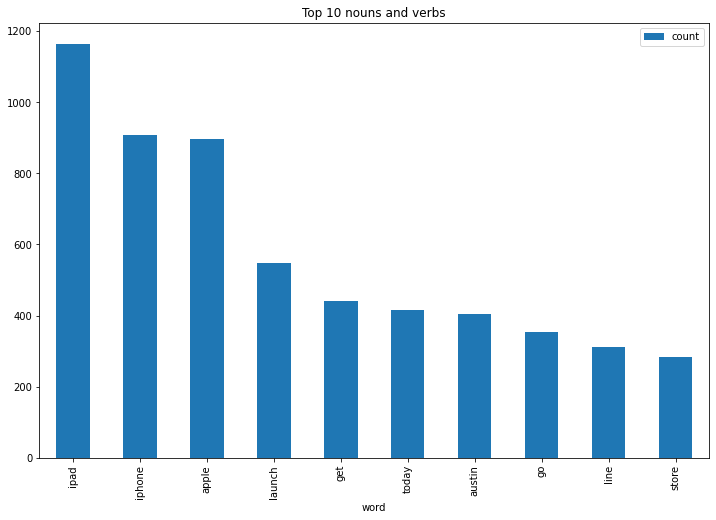

In [ ]:
# Visualizing results (Barchart for top 10 nouns + verbs)
wd_df[0:10].plot.bar(x='word',figsize=(12,8),title='Top 10 nouns and verbs');

In [ ]:
def ner_displacy(token):
    ner_sentence = ner(token)
    displacy.render(ner_sentence, jupyter=True, \
                    options={"compact": False, \
                             "distance": 90, \
                             "word_spacing":20, \
                             "arrow_spacing":10, \
                             "arrow_stroke": 2, \
                             "arrow_width": 5})

for token in doc_block:
    ner_displacy(token)

ValueError: ignored

In [ ]:
# Filtering the adjectives only
adj=[token.text for token in doc_block if token.pos_ in ('ADJ')]
print(adj[100:200])

['south', 'good', 'special', 'open', '6th', 'smart', 'impressive', 'ipad', 'first', 'great', 'mobile', 'large', 'free', 'lonely', 'limited', '\x9d', 'free', 'happy', 'semantic', 'hilarious', 'new', 'early', 'long', 'many', 'closed', 'fb', 'major', 'new', 'social', 'digital', 'real', 'breathtaking', 'visual', 'clear', 'essential', 'new', 'great', 'effective', '3gs', 'greatergood', 'new', 'social', 'android', 'private', 'slow', 'early', 'awesome', 'sweepstake', 'giveaway', '6th', 'interactive', 'augmented', 'mobile', 'physical', 'nice', 'true', 'hungry', 'great', 'vietnamese', '6th', 'ajax', 'happy', 'able', 'new', 'cool', 'new', 'open', 'temporary', 'free', 'tradeshow', 'ill', 'ahhh', '\x89', 'ûï', 'major', 'new', 'social', '\x9d', 'great', 'awesome', 'ipad', 'quibid', 'stupid', 'able', 'excellent', 'great', 'third', 'new', 'open', 'temporary', 'fascist', '\x9d', '6th', 'st', 'close', 'apptastic', 'ill', 'major', 'new', 'social']


In [ ]:
# Counting the noun & verb tokens
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()

X=cv.fit_transform(adj)
sum_words=X.sum(axis=0)

words_freq=[(word,sum_words[0,idx]) for word,idx in cv.vocabulary_.items()]
words_freq=sorted(words_freq, key=lambda x: x[1], reverse=True)

wd_df=pd.DataFrame(words_freq)
wd_df.columns=['word','count']
wd_df[0:10] # viewing top ten results

,word,count
0,new,708
1,open,293
2,social,258
3,major,211
4,free,199
5,temporary,173
6,good,165
7,great,138
8,mobile,117
9,big,90


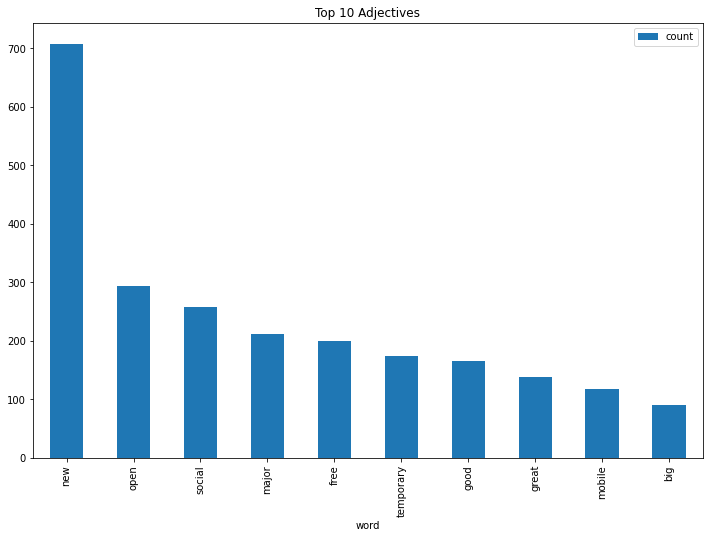

In [ ]:
# Visualizing results (Barchart for top 10 nouns + verbs)
wd_df[0:10].plot.bar(x='word',figsize=(12,8),title='Top 10 Remarks');

In [ ]:
from nltk import tokenize
sentences=tokenize.sent_tokenize(' '.join(df))
sentences

['The Web Designer\x89Ûªs Guide to iOS (and Android) Apps, today @mention 10 a.m!',
 '{link} #sxsw RT @mention Line for iPad 2 is longer today than yesterday.',
 '#SXSW  // are you getting in line again today just for fun?',
 'Crazy that Apple is opening a temporary store in Austin tomorrow to handle the rabid #sxsw eye pad too seekers.',
 'The lesson from Google One Pass: In this digital environment, users want to purchase across every platform with one tool.',
 '#sxsw #elonsxsw RT @mention At the panel: &quot;Your mom has an ipad, designing for boomers&quot; #sxsw RT @mention I think my effing hubby is in line for an #iPad 2.',
 'Can someone point him towards the line-up for wife number #2.',
 '#sxswi #sxsw &quot;Android users are not iPhone users.',
 '(They use the Options menu, and Contextual menu)&quot; ~@mention #sxsw Wow!',
 'RT@mention We interrupt your regularly scheduled #sxsw geek programming with big news {link}  #google #circles Google to Launch New Social Network Called C

In [ ]:
import textblob

In [ ]:
sent_df=pd.DataFrame(sentences,columns=['sentence'])
sent_df

,sentence
0,The Web DesignerÛªs Guide to iOS (and Android...
1,{link} #sxsw RT @mention Line for iPad 2 is lo...
2,#SXSW // are you getting in line again today ...
3,Crazy that Apple is opening a temporary store ...
4,The lesson from Google One Pass: In this digit...
...,...
6417,Thanks @mention for hosting this event #sxsw #...
6418,#sxsw RT @mention RT @mention Download 20+ fre...
6419,{link} #SXSW OH at Texas Social Media Awards: ...
6420,Just Google it.'


In [ ]:
tweets = ['skillfully done, cupertino: {link} Really liking the #sxsw iPhone app...','Thanks for making an event app.','that appears to work well!!!','#sxsw @mention saw a man drop his iphone in a gutter last year.']
from textblob import TextBlob

In [ ]:
review_1= TextBlob("Thanks for making an event app.")

In [ ]:
review_1.sentiment

Sentiment(polarity=0.5, subjectivity=0.6)

In [ ]:
review_2= TextBlob("that appears to work well!!!")
review_2.sentiment

Sentiment(polarity=0.0, subjectivity=0.0)

In [ ]:
tweets

['skillfully done, cupertino: {link} Really liking the #sxsw iPhone app...',
 'Thanks for making an event app.',
 'that appears to work well!!!',
 '#sxsw @mention saw a man drop his iphone in a gutter last year.']

In [ ]:
for t in tweets:
    res = TextBlob(t).sentiment
    print(res)

Sentiment(polarity=-0.275, subjectivity=0.6)
Sentiment(polarity=0.2, subjectivity=0.2)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.0, subjectivity=0.06666666666666667)


In [ ]:
for t in tweets:
    res = TextBlob(t).sentiment
    print(f'{t} ==> Sentiment Analysis {res}')

skillfully done, cupertino: {link} Really liking the #sxsw iPhone app... ==> Sentiment Analysis Sentiment(polarity=-0.275, subjectivity=0.6)
Thanks for making an event app. ==> Sentiment Analysis Sentiment(polarity=0.2, subjectivity=0.2)
that appears to work well!!! ==> Sentiment Analysis Sentiment(polarity=0.0, subjectivity=0.0)
#sxsw @mention saw a man drop his iphone in a gutter last year. ==> Sentiment Analysis Sentiment(polarity=0.0, subjectivity=0.06666666666666667)


In [ ]:
sent_df

,sentence
0,The Web DesignerÛªs Guide to iOS (and Android...
1,{link} #sxsw RT @mention Line for iPad 2 is lo...
2,#SXSW // are you getting in line again today ...
3,Crazy that Apple is opening a temporary store ...
4,The lesson from Google One Pass: In this digit...
...,...
6417,Thanks @mention for hosting this event #sxsw #...
6418,#sxsw RT @mention RT @mention Download 20+ fre...
6419,{link} #SXSW OH at Texas Social Media Awards: ...
6420,Just Google it.'


In [ ]:
for sentence in sent_df:
    res=TextBlob(sentence).sentiment
    print(res)

Sentiment(polarity=0.0, subjectivity=0.0)


In [ ]:
# how many words are there in a sentence?
sent_df['word_count']=sent_df['sentence'].str.split().apply(len)
sent_df['word_count']

0       13
1       13
2       12
3       20
4       20
        ..
6417    21
6418    16
6419    16
6420     3
6421    17
Name: word_count, Length: 6422, dtype: int64

PART 2

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt


In [ ]:
import string
import spacy 
from wordcloud import WordCloud



In [ ]:
import pandas as pd
import io
 
df = pd.read_csv(io.BytesIO(uploaded[r'Product_details - Copy.csv']))
print(df)

      Text_ID                                Product_Description  \
0        3057  The Web DesignerÛªs Guide to iOS (and Android...   
1        6254  RT @mention Line for iPad 2 is longer today th...   
2        8212  Crazy that Apple is opening a temporary store ...   
3        4422  The lesson from Google One Pass: In this digit...   
4        5526  RT @mention At the panel: &quot;Your mom has a...   
...       ...                                                ...   
6359     2945  Thanks @mention for hosting this event #sxsw #...   
6360     4528  SXSW iPhone app is awesome, but iPad app crash...   
6361     6526  RT @mention RT @mention Download 20+ free trac...   
6362     2110  OH at Texas Social Media Awards: 'You don't ne...   
6363     2177  #Google launching a &quot;major&quot; new soci...   

      Product_Type  Sentiment  
0                9          2  
1                9          2  
2                9          2  
3                9          2  
4                9     

In [ ]:
#classifying ratings

good_rate = len(df[df['Sentiment']>2])
average_rate=len(df[df['Sentiment']==2])
poor_rate=len(df[df['Sentiment']<=1])


#######################################################

print("Good Rating = ",good_rate)
print("average_rate = ",average_rate)
print("poor_rate = ",poor_rate)

Good Rating =  2089
average_rate =  3765
poor_rate =  510


In [ ]:
total = len(df)
print('Total number of product description = ',total)

Total number of product description =  6364


In [ ]:
print("Number of unique text id :",len(df['Text_ID'].unique()))

Number of unique text id : 6364


In [ ]:
# Statistics of non-numeric variables

# Number of unique customers
print('\nNumber of unique customers : {}'.format(len(df['Text_ID'].unique())))
      
# Number of unique products
print('\nNumber of unique products : {}'.format(len(df['Product_Type'].unique())))


Number of unique customers : 6364

Number of unique products : 10


In [ ]:
x = df['Product_Description'] 

In [ ]:
x

0       The Web DesignerÛªs Guide to iOS (and Android...
1       RT @mention Line for iPad 2 is longer today th...
2       Crazy that Apple is opening a temporary store ...
3       The lesson from Google One Pass: In this digit...
4       RT @mention At the panel: &quot;Your mom has a...
                              ...                        
6359    Thanks @mention for hosting this event #sxsw #...
6360    SXSW iPhone app is awesome, but iPad app crash...
6361    RT @mention RT @mention Download 20+ free trac...
6362    OH at Texas Social Media Awards: 'You don't ne...
6363    #Google launching a &quot;major&quot; new soci...
Name: Product_Description, Length: 6364, dtype: object

In [ ]:
df

,Text_ID,Product_Description,Product_Type,Sentiment
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2
2,8212,Crazy that Apple is opening a temporary store ...,9,2
3,4422,The lesson from Google One Pass: In this digit...,9,2
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2
...,...,...,...,...
6359,2945,Thanks @mention for hosting this event #sxsw #...,9,2
6360,4528,"SXSW iPhone app is awesome, but iPad app crash...",7,1
6361,6526,RT @mention RT @mention Download 20+ free trac...,9,2
6362,2110,OH at Texas Social Media Awards: 'You don't ne...,9,2


In [ ]:
# Import pandas package
import pandas as pd

# Define a dictionary containing Students data
#data = {'Name': ['Jai', 'Princi', 'Gaurav', 'Anuj'],
#		'Height': [5.1, 6.2, 5.1, 5.2],
#		'Qualification': ['Msc', 'MA', 'Msc', 'Msc']}

# Convert the dictionary into DataFrame


# Declare a list that is to be converted into a column
#WordCount = ['word_count']

# Using 'Address' as the column name
# and equating it to the list
#df['WordCount'] = WordCount

# Observe the result
#print(df)
sent_df['word_count']

0       13
1       13
2       12
3       20
4       20
        ..
6417    21
6418    16
6419    16
6420     3
6421    17
Name: word_count, Length: 6422, dtype: int64

In [ ]:
wc=sent_df['word_count']
df.join(wc)

,Text_ID,Product_Description,Product_Type,Sentiment,word_count
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2,13
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2,13
2,8212,Crazy that Apple is opening a temporary store ...,9,2,12
3,4422,The lesson from Google One Pass: In this digit...,9,2,20
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2,20
...,...,...,...,...,...
6359,2945,Thanks @mention for hosting this event #sxsw #...,9,2,6
6360,4528,"SXSW iPhone app is awesome, but iPad app crash...",7,1,5
6361,6526,RT @mention RT @mention Download 20+ free trac...,9,2,11
6362,2110,OH at Texas Social Media Awards: 'You don't ne...,9,2,9


In [ ]:
# importing pandas module
import pandas as pd

# importing module for regex
import re

from textblob import TextBlob


def senti(x):
    return TextBlob(x).sentiment.polarity
def subjecti(y):
    return TextBlob(y).sentiment.subjectivity


# String to be searched in start of string
#search ="a"

# count of occurrence of a and creating new column
df['totalwords'] = df['Product_Description'].str.split().str.len()

df['Polarity'] = df['Product_Description'].apply(senti)
df['Subjectivity'] = df['Product_Description'].apply(subjecti)
# display
df
  



,Text_ID,Product_Description,Product_Type,Sentiment,totalwords,Polarity,Subjectivity
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2,15,0.000000,0.000000
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2,23,0.300000,0.200000
2,8212,Crazy that Apple is opening a temporary store ...,9,2,20,-0.600000,0.900000
3,4422,The lesson from Google One Pass: In this digit...,9,2,22,0.000000,0.000000
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2,14,0.000000,0.000000
...,...,...,...,...,...,...,...
6359,2945,Thanks @mention for hosting this event #sxsw #...,9,2,10,0.200000,0.200000
6360,4528,"SXSW iPhone app is awesome, but iPad app crash...",7,1,12,1.000000,1.000000
6361,6526,RT @mention RT @mention Download 20+ free trac...,9,2,17,0.500000,0.800000
6362,2110,OH at Texas Social Media Awards: 'You don't ne...,9,2,19,0.033333,0.066667


In [ ]:
df.pivot_table(columns=['Product_Type'], values=['Polarity','Subjectivity'])

Product_Type,0,1,2,3,4,5,6,7,8,9
Polarity,0.211133,0.229661,0.157881,0.162958,0.427725,0.155544,0.149821,0.225015,0.148490,0.082778
Subjectivity,0.464005,0.432315,0.413536,0.399473,0.700946,0.384955,0.411461,0.519194,0.459542,0.332855


In [ ]:
df.pivot_table(columns=['Sentiment'], values=['Polarity','Subjectivity'])

Sentiment,0,1,2,3
Polarity,0.067807,0.009970,0.079866,0.198570
Subjectivity,0.392774,0.411138,0.328524,0.430741


In [ ]:
import pandas as pd
pd.crosstab(df.Polarity,df.Sentiment).T

Polarity,-1.000000,-1.000000,-0.937500,-0.875000,-0.850000,-0.800000,-0.750000,-0.725000,-0.700000,-0.700000,...,0.800000,0.812500,0.850000,0.866667,0.875000,0.900000,0.910000,0.937500,0.976563,1.000000
Sentiment,,,,,,,,,,,,,,,,,,,,,
0,1,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,0,2
1,4,1,1,0,1,2,7,1,2,1,...,2,0,0,0,0,1,0,0,0,11
2,5,0,10,2,0,5,90,0,0,2,...,26,5,0,1,0,3,0,0,0,56
3,1,0,3,1,0,1,18,0,0,3,...,32,2,1,0,5,7,2,2,1,60


In [140]:
def sentimen(z):
    if  z > 2:
         return 'Good'
    elif z == 2:     
         return 'Average'
    elif z < 2:
         return 'Poor'


In [142]:
df['rating'] = df['Sentiment'].apply(sentimen)

TypeError: ignored

In [ ]:
df['Product_Description'] = [Product_Description.strip() for Product_Description in df.Product_Description]

In [ ]:
import re

def clean_text(x):
    x = x.lower()
    x  = re.sub('\[.*?\]','',x)
    x = re.sub('[$s]'% re.escape(string.punctuation),'',text)
    x = re.sub('\w*\d\w*','',x)
    x =re.sub("[0-9" "]+"," ",x)
    x= re.sub('["""...]','',x)
clean = lambda x: clean_text(x)

In [ ]:
clean_text = lambda x: clean_text(df['Product_Description'])

In [ ]:
df

,Text_ID,Product_Description,Product_Type,Sentiment
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2
2,8212,Crazy that Apple is opening a temporary store ...,9,2
3,4422,The lesson from Google One Pass: In this digit...,9,2
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2
...,...,...,...,...
6359,2945,Thanks @mention for hosting this event #sxsw #...,9,2
6360,4528,"SXSW iPhone app is awesome, but iPad app crash...",7,1
6361,6526,RT @mention RT @mention Download 20+ free trac...,9,2
6362,2110,OH at Texas Social Media Awards: 'You don't ne...,9,2


In [ ]:
clean

<function __main__.<lambda>(x)>

In [ ]:
df


,Text_ID,Product_Description,Product_Type,Sentiment
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2
2,8212,Crazy that Apple is opening a temporary store ...,9,2
3,4422,The lesson from Google One Pass: In this digit...,9,2
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2
...,...,...,...,...
6359,2945,Thanks @mention for hosting this event #sxsw #...,9,2
6360,4528,"SXSW iPhone app is awesome, but iPad app crash...",7,1
6361,6526,RT @mention RT @mention Download 20+ free trac...,9,2
6362,2110,OH at Texas Social Media Awards: 'You don't ne...,9,2


In [ ]:
df['Product_Description'] = df['Product_Description'].apply(lambda x: re.sub('[^a-zA-Z0-9\s]','',x))

In [ ]:
from nltk.sentiment import SentimentIntensityAnalyzer
from tqdm.notebook import tqdm
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

In [ ]:
sia = SentimentIntensityAnalyzer()

In [ ]:
sia.polarity_scores('this is so !')

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

In [ ]:
res = {}
for i, row in tqdm(df.iterrows(),total=len(df)):
    Product_Description=row['Product_Description']
    myid = row['Text_ID']
    res[myid]=sia.polarity_scores(Product_Description)

  0%|          | 0/6364 [00:00<?, ?it/s]

In [ ]:
res

{3057: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0},
 6254: {'neg': 0.0, 'neu': 0.858, 'pos': 0.142, 'compound': 0.5106},
 8212: {'neg': 0.118, 'neu': 0.882, 'pos': 0.0, 'compound': -0.34},
 4422: {'neg': 0.0, 'neu': 0.942, 'pos': 0.058, 'compound': 0.0772},
 5526: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0},
 6064: {'neg': 0.0, 'neu': 0.947, 'pos': 0.053, 'compound': 0.0772},
 7713: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0},
 2975: {'neg': 0.2, 'neu': 0.619, 'pos': 0.181, 'compound': 0.1531},
 818: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0},
 1318: {'neg': 0.0, 'neu': 0.708, 'pos': 0.292, 'compound': 0.7351},
 5454: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0},
 1618: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0},
 3902: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0},
 6513: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0},
 728: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0},
 7667: {'neg': 0.293, 'neu': 0.

In [ ]:
pd.DataFrame(res).T

,neg,neu,pos,compound
3057,0.000,1.000,0.000,0.0000
6254,0.000,0.858,0.142,0.5106
8212,0.118,0.882,0.000,-0.3400
4422,0.000,0.942,0.058,0.0772
5526,0.000,1.000,0.000,0.0000
...,...,...,...,...
2945,0.000,0.756,0.244,0.4404
4528,0.000,0.812,0.188,0.3716
6526,0.000,0.829,0.171,0.5106
2110,0.000,0.857,0.143,0.4588


In [ ]:
vaders = pd.DataFrame(res).T
vaders

,neg,neu,pos,compound
3057,0.000,1.000,0.000,0.0000
6254,0.000,0.858,0.142,0.5106
8212,0.118,0.882,0.000,-0.3400
4422,0.000,0.942,0.058,0.0772
5526,0.000,1.000,0.000,0.0000
...,...,...,...,...
2945,0.000,0.756,0.244,0.4404
4528,0.000,0.812,0.188,0.3716
6526,0.000,0.829,0.171,0.5106
2110,0.000,0.857,0.143,0.4588


In [ ]:
vaders = vaders.reset_index().rename(columns={'index':'id'})

In [ ]:
vaders.drop('id',axis =1)

,neg,neu,pos,compound
0,0.000,1.000,0.000,0.0000
1,0.000,0.858,0.142,0.5106
2,0.118,0.882,0.000,-0.3400
3,0.000,0.942,0.058,0.0772
4,0.000,1.000,0.000,0.0000
...,...,...,...,...
6359,0.000,0.756,0.244,0.4404
6360,0.000,0.812,0.188,0.3716
6361,0.000,0.829,0.171,0.5106
6362,0.000,0.857,0.143,0.4588


In [ ]:
df1 = pd.merge(vaders,df,left_index = True,right_index = True)

In [ ]:
df1.drop('id',axis =1)

,neg,neu,pos,compound,Text_ID,Product_Description,Product_Type,Sentiment
0,0.000,1.000,0.000,0.0000,3057,The Web Designers Guide to iOS and Android App...,9,2
1,0.000,0.858,0.142,0.5106,6254,RT mention Line for iPad 2 is longer today tha...,9,2
2,0.118,0.882,0.000,-0.3400,8212,Crazy that Apple is opening a temporary store ...,9,2
3,0.000,0.942,0.058,0.0772,4422,The lesson from Google One Pass In this digita...,9,2
4,0.000,1.000,0.000,0.0000,5526,RT mention At the panel quotYour mom has an ip...,9,2
...,...,...,...,...,...,...,...,...
6359,0.000,0.756,0.244,0.4404,2945,Thanks mention for hosting this event sxsw sxs...,9,2
6360,0.000,0.812,0.188,0.3716,4528,SXSW iPhone app is awesome but iPad app crashe...,7,1
6361,0.000,0.829,0.171,0.5106,6526,RT mention RT mention Download 20 free tracks ...,9,2
6362,0.000,0.857,0.143,0.4588,2110,OH at Texas Social Media Awards You dont need ...,9,2


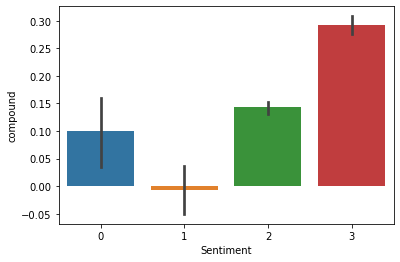

In [ ]:
sns.barplot(data=df1,x='Sentiment',y = 'compound')

plt.show()

PART 3

In [ ]:
import warnings

warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", DeprecationWarning)

In [ ]:
import os
import io
import pandas as pd

dataset = pd.read_csv(io.BytesIO(uploaded[r'Product_details - Copy.csv']))
print(dataset)

      Text_ID                                Product_Description  \
0        3057  The Web DesignerÛªs Guide to iOS (and Android...   
1        6254  RT @mention Line for iPad 2 is longer today th...   
2        8212  Crazy that Apple is opening a temporary store ...   
3        4422  The lesson from Google One Pass: In this digit...   
4        5526  RT @mention At the panel: &quot;Your mom has a...   
...       ...                                                ...   
6359     2945  Thanks @mention for hosting this event #sxsw #...   
6360     4528  SXSW iPhone app is awesome, but iPad app crash...   
6361     6526  RT @mention RT @mention Download 20+ free trac...   
6362     2110  OH at Texas Social Media Awards: 'You don't ne...   
6363     2177  #Google launching a &quot;major&quot; new soci...   

      Product_Type  Sentiment  
0                9          2  
1                9          2  
2                9          2  
3                9          2  
4                9     

In [ ]:
dataset.head(20)

,Text_ID,Product_Description,Product_Type,Sentiment
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2
2,8212,Crazy that Apple is opening a temporary store ...,9,2
3,4422,The lesson from Google One Pass: In this digit...,9,2
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2
5,6064,RT @mention I think my effing hubby is in line...,6,1
6,7713,&quot;Android users are not iPhone users. (The...,9,2
7,2975,Wow! RT@mention We interrupt your regularly sc...,9,3
8,818,Google to Launch New Social Network Called Cir...,9,2
9,1318,@mention Welcome! Enjoy #Sxsw and ride anywhe...,9,2


In [ ]:
print(dataset.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6364 entries, 0 to 6363
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Text_ID              6364 non-null   int64 
 1   Product_Description  6364 non-null   object
 2   Product_Type         6364 non-null   int64 
 3   Sentiment            6364 non-null   int64 
dtypes: int64(3), object(1)
memory usage: 199.0+ KB
None


In [ ]:
print(dataset["Product_Description"].iloc[0:100])

0     The Web DesignerÛªs Guide to iOS (and Android...
1     RT @mention Line for iPad 2 is longer today th...
2     Crazy that Apple is opening a temporary store ...
3     The lesson from Google One Pass: In this digit...
4     RT @mention At the panel: &quot;Your mom has a...
                            ...                        
95    #LonelyPlanet #Austin iPhone app is a (free!) ...
96    Download of the Day: Lonely Planet Austin, Fre...
97    @mention ÛÏ@mention Does the pop up Apple sto...
98    Heading to free Google-sponsored happy hour fo...
99    Like @mention Download 'Freak Jet' on your iPh...
Name: Product_Description, Length: 100, dtype: object


In [ ]:
print(dataset.Product_Type.unique())

[9 6 7 2 8 3 0 5 1 4]


In [ ]:
print(dataset.Sentiment.unique())

[2 1 3 0]


In [ ]:
#NLP PREPROCESSING
sample_review = dataset["Product_Description"].iloc[0:100]
print(sample_review)

0     The Web DesignerÛªs Guide to iOS (and Android...
1     RT @mention Line for iPad 2 is longer today th...
2     Crazy that Apple is opening a temporary store ...
3     The lesson from Google One Pass: In this digit...
4     RT @mention At the panel: &quot;Your mom has a...
                            ...                        
95    #LonelyPlanet #Austin iPhone app is a (free!) ...
96    Download of the Day: Lonely Planet Austin, Fre...
97    @mention ÛÏ@mention Does the pop up Apple sto...
98    Heading to free Google-sponsored happy hour fo...
99    Like @mention Download 'Freak Jet' on your iPh...
Name: Product_Description, Length: 100, dtype: object


In [ ]:
import html

decoded_review = html.unescape(sample_review)
print(decoded_review)

0     The Web DesignerÛªs Guide to iOS (and Android...
1     RT @mention Line for iPad 2 is longer today th...
2     Crazy that Apple is opening a temporary store ...
3     The lesson from Google One Pass: In this digit...
4     RT @mention At the panel: &quot;Your mom has a...
                            ...                        
95    #LonelyPlanet #Austin iPhone app is a (free!) ...
96    Download of the Day: Lonely Planet Austin, Fre...
97    @mention ÛÏ@mention Does the pop up Apple sto...
98    Heading to free Google-sponsored happy hour fo...
99    Like @mention Download 'Freak Jet' on your iPh...
Name: Product_Description, Length: 100, dtype: object


In [ ]:
pattern = r"\&\#[0-9]+\;"

dataset["preprocessed"] = dataset["Product_Description"].str.replace(pat=pattern, repl="", regex=True)

print(dataset["preprocessed"].iloc[0:100])

0     The Web DesignerÛªs Guide to iOS (and Android...
1     RT @mention Line for iPad 2 is longer today th...
2     Crazy that Apple is opening a temporary store ...
3     The lesson from Google One Pass: In this digit...
4     RT @mention At the panel: &quot;Your mom has a...
                            ...                        
95    #LonelyPlanet #Austin iPhone app is a (free!) ...
96    Download of the Day: Lonely Planet Austin, Fre...
97    @mention ÛÏ@mention Does the pop up Apple sto...
98    Heading to free Google-sponsored happy hour fo...
99    Like @mention Download 'Freak Jet' on your iPh...
Name: preprocessed, Length: 100, dtype: object


In [ ]:
%%time
import re
import nltk
nltk.download('omw-1.4')

from nltk import word_tokenize, pos_tag
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import sent_tokenize
from nltk.corpus import wordnet

#import nltk resources
resources = ["wordnet", "stopwords", "punkt", \
             "averaged_perceptron_tagger", "maxent_treebank_pos_tagger"]

for resource in resources:
    try:
        nltk.data.find("tokenizers/" + resource)
    except LookupError:
        nltk.download(resource)

#create Lemmatizer object
lemma = WordNetLemmatizer()

def lemmatize_word(tagged_token):
    """ Returns lemmatized word given its tag"""
    root = []
    for token in tagged_token:
        tag = token[1][0]
        word = token[0]
        if tag.startswith('J'):
            root.append(lemma.lemmatize(word, wordnet.ADJ))
        elif tag.startswith('V'):
            root.append(lemma.lemmatize(word, wordnet.VERB))
        elif tag.startswith('N'):
            root.append(lemma.lemmatize(word, wordnet.NOUN))
        elif tag.startswith('R'):
            root.append(lemma.lemmatize(word, wordnet.ADV))
        else:          
            root.append(word)
    return root

def lemmatize_doc(document):
    """ Tags words then returns sentence with lemmatized words"""
    lemmatized_list = []
    tokenized_sent = sent_tokenize(document)
    for sentence in tokenized_sent:
        no_punctuation = re.sub(r"[`'\",.!?()]", " ", sentence)
        tokenized_word = word_tokenize(no_punctuation)
        tagged_token = pos_tag(tokenized_word)
        lemmatized = lemmatize_word(tagged_token)
        lemmatized_list.extend(lemmatized)
    return " ".join(lemmatized_list)

#apply our functions
dataset["preprocessed"] = dataset["preprocessed"].apply(lambda row: lemmatize_doc(row))

print(dataset["preprocessed"].iloc[0:100])

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package maxent_treebank_pos_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/maxent_treebank_pos_tagger.zip.


0     The Web DesignerÛªs Guide to iOS and Android ...
1     RT @ mention Line for iPad 2 be long today tha...
2     Crazy that Apple be open a temporary store in ...
3     The lesson from Google One Pass : In this digi...
4     RT @ mention At the panel : & quot ; Your mom ...
                            ...                        
95    # LonelyPlanet # Austin iPhone app be a free g...
96    Download of the Day : Lonely Planet Austin Fre...
97    @ mention ÛÏ @ mention Does the pop up Apple ...
98    Heading to free Google-sponsored happy hour fo...
99    Like @ mention Download Freak Jet on your iPho...
Name: preprocessed, Length: 100, dtype: object
CPU times: user 14.5 s, sys: 618 ms, total: 15.1 s
Wall time: 16.3 s


In [ ]:
from unicodedata import normalize

remove_accent = lambda text: normalize("NFKD", text).encode("ascii", "ignore").decode("utf-8", "ignore")

dataset["preprocessed"] = dataset["preprocessed"].apply(remove_accent)

print(dataset["preprocessed"].iloc[0:100])


0     The Web DesignerUas Guide to iOS and Android A...
1     RT @ mention Line for iPad 2 be long today tha...
2     Crazy that Apple be open a temporary store in ...
3     The lesson from Google One Pass : In this digi...
4     RT @ mention At the panel : & quot ; Your mom ...
                            ...                        
95    # LonelyPlanet # Austin iPhone app be a free g...
96    Download of the Day : Lonely Planet Austin Fre...
97    @ mention UI @ mention Does the pop up Apple s...
98    Heading to free Google-sponsored happy hour fo...
99    Like @ mention Download Freak Jet on your iPho...
Name: preprocessed, Length: 100, dtype: object


In [ ]:
pattern = r"[^\w\s]"

dataset["preprocessed"] = dataset["preprocessed"].str.replace(pat=pattern, repl=" ", regex=True)

print(dataset["preprocessed"].iloc[0:100])

0     The Web DesignerUas Guide to iOS and Android A...
1     RT   mention Line for iPad 2 be long today tha...
2     Crazy that Apple be open a temporary store in ...
3     The lesson from Google One Pass   In this digi...
4     RT   mention At the panel     quot   Your mom ...
                            ...                        
95      LonelyPlanet   Austin iPhone app be a free g...
96    Download of the Day   Lonely Planet Austin Fre...
97      mention UI   mention Does the pop up Apple s...
98    Heading to free Google sponsored happy hour fo...
99    Like   mention Download Freak Jet on your iPho...
Name: preprocessed, Length: 100, dtype: object


In [ ]:
dataset["preprocessed"] = dataset["preprocessed"].str.lower()

print(dataset["preprocessed"].iloc[0:100])

0     the web designeruas guide to ios and android a...
1     rt   mention line for ipad 2 be long today tha...
2     crazy that apple be open a temporary store in ...
3     the lesson from google one pass   in this digi...
4     rt   mention at the panel     quot   your mom ...
                            ...                        
95      lonelyplanet   austin iphone app be a free g...
96    download of the day   lonely planet austin fre...
97      mention ui   mention does the pop up apple s...
98    heading to free google sponsored happy hour fo...
99    like   mention download freak jet on your ipho...
Name: preprocessed, Length: 100, dtype: object


In [ ]:
#REMOVING STOP WORDS
from nltk.corpus import stopwords

stop_words = stopwords.words("english")

stop_words = [word.replace("\'", "") for word in stop_words]

print(f"sample stop words: {stop_words[:15]} \n")

remove_stop_words = lambda row: " ".join([token for token in row.split(" ") \
                                          if token not in stop_words])
dataset["preprocessed"] = dataset["preprocessed"].apply(remove_stop_words)

print(dataset["preprocessed"].iloc[0:100])

sample stop words: ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', 'youre', 'youve', 'youll', 'youd', 'your', 'yours'] 

0     web designeruas guide ios android apps today  ...
1     rt   mention line ipad 2 long today yesterday ...
2     crazy apple open temporary store austin tomorr...
3     lesson google one pass   digital environment u...
4     rt   mention panel     quot   mom ipad design ...
                            ...                        
95      lonelyplanet   austin iphone app free godsen...
96    download day   lonely planet austin free limit...
97      mention ui   mention pop apple store austin ...
98    heading free google sponsored happy hour seman...
99    like   mention download freak jet iphone hilar...
Name: preprocessed, Length: 100, dtype: object


In [ ]:
#REMOVE EXTRA SPACES
pattern = r"[\s]+"

dataset["preprocessed"] = dataset["preprocessed"].str.replace(pat=pattern, repl=" ", regex=True)

print(dataset["preprocessed"].iloc[0:100])

0     web designeruas guide ios android apps today m...
1     rt mention line ipad 2 long today yesterday sx...
2     crazy apple open temporary store austin tomorr...
3     lesson google one pass digital environment use...
4     rt mention panel quot mom ipad design boomer q...
                            ...                        
95     lonelyplanet austin iphone app free godsend g...
96    download day lonely planet austin free limited...
97     mention ui mention pop apple store austin sti...
98    heading free google sponsored happy hour seman...
99    like mention download freak jet iphone hilario...
Name: preprocessed, Length: 100, dtype: object


In [ ]:
#TOKENIZATION
corpora = dataset["preprocessed"].values
tokenized = [corpus.split(" ") for corpus in corpora]

print(tokenized[0:100])

[['web', 'designeruas', 'guide', 'ios', 'android', 'apps', 'today', 'mention', '10', 'link', 'sxsw'], ['rt', 'mention', 'line', 'ipad', '2', 'long', 'today', 'yesterday', 'sxsw', 'get', 'line', 'today', 'fun'], ['crazy', 'apple', 'open', 'temporary', 'store', 'austin', 'tomorrow', 'handle', 'rabid', 'sxsw', 'eye', 'pad', 'seeker'], ['lesson', 'google', 'one', 'pass', 'digital', 'environment', 'user', 'want', 'purchase', 'across', 'every', 'platform', 'one', 'tool', 'sxsw', 'elonsxsw'], ['rt', 'mention', 'panel', 'quot', 'mom', 'ipad', 'design', 'boomer', 'quot', 'sxsw'], ['rt', 'mention', 'think', 'eff', 'hubby', 'line', 'ipad', '2', 'someone', 'point', 'towards', 'line', 'wife', 'number', '2', 'sxswi', 'sxsw'], ['', 'quot', 'android', 'user', 'iphone', 'user', 'use', 'options', 'menu', 'contextual', 'menu', 'quot', 'mention', 'sxsw'], ['wow', 'rt', 'mention', 'interrupt', 'regularly', 'schedule', 'sxsw', 'geek', 'programming', 'big', 'news', 'link', 'google', 'circle'], ['google', 'la

In [ ]:
#PHRASE MODELING
from gensim.models import Phrases
from gensim.models.phrases import Phraser

bi_gram = Phrases(tokenized, min_count=300, threshold=50)

tri_gram = Phrases(bi_gram[tokenized], min_count=300, threshold=50)

In [ ]:
uni_gram_tokens = set([token for text in tokenized for token in text])
uni_gram_tokens = set(filter(lambda x: x != "", uni_gram_tokens))

print(list(uni_gram_tokens)[:50])

['breathe', 'scan', 'kxan', 'pp', 'media', 'vote', 'guykawasaki', 'milk', 'anatomy', 'oy', 'retail', 'wew', 'interest', 'ridiculously', 'videogame', 'form', 'win', 'tall', 'suggest', 'reach', 'mu_', 'attend', 'gummy', 'saytextson', 'lam', 'newspaper', 'dfcbto', 'endorse', 'raffle', 'itunes', 'video', 'ajax', 'smc', 'common', 'podcasters', 'rage', 'wise', 'forward', 'ituas', 'hiring', 'topic', 'muahahahahhaahahaa', 'message', 'foraeiphone', 'starry', 'dual', 'previews', 'battledecks', 'amazon', 'bernard']


In [ ]:
bigram_min = bi_gram.min_count

bi_condition = lambda x: x[1] >= bigram_min

bi_gram_tokens = dict(filter(bi_condition, bi_gram.vocab.items()))
bi_gram_tokens = set([token.decode("utf-8") \
                      for token in bi_gram_tokens])

bi_grams_only = bi_gram_tokens.difference(uni_gram_tokens)
print(list(bi_grams_only)[:50])

['', 'mention_sxsw', 'link_', 'sxsw_link', 'link_sxsw', 'mention_mention', 'rt_mention', 'mention_google', '_mention']


In [ ]:
trigram_min = tri_gram.min_count

tri_condition = lambda x: x[1] >= trigram_min

tri_gram_tokens = dict(filter(tri_condition, tri_gram.vocab.items()))
tri_gram_tokens = set([token.decode("utf-8") \
                       for token in tri_gram_tokens])

tri_grams_only = tri_gram_tokens.difference(bi_gram_tokens)
print(list(tri_grams_only)[:50])

[]


In [ ]:
tokenized = [Phraser(tri_gram)[Phraser(bi_gram)[i]] for i in tokenized]

In [ ]:
 
 tokenized = [list(filter(lambda x: len(x) > 1, document)) \
             for document in tokenized]

print(tokenized[0:100])


[['web', 'designeruas', 'guide', 'ios', 'android', 'apps', 'today', 'mention', '10', 'link', 'sxsw'], ['rt', 'mention', 'line', 'ipad', 'long', 'today', 'yesterday', 'sxsw', 'get', 'line', 'today', 'fun'], ['crazy', 'apple', 'open', 'temporary', 'store', 'austin', 'tomorrow', 'handle', 'rabid', 'sxsw', 'eye', 'pad', 'seeker'], ['lesson', 'google', 'one', 'pass', 'digital', 'environment', 'user', 'want', 'purchase', 'across', 'every', 'platform', 'one', 'tool', 'sxsw', 'elonsxsw'], ['rt', 'mention', 'panel', 'quot', 'mom', 'ipad', 'design', 'boomer', 'quot', 'sxsw'], ['rt', 'mention', 'think', 'eff', 'hubby', 'line', 'ipad', 'someone', 'point', 'towards', 'line', 'wife', 'number', 'sxswi', 'sxsw'], ['quot', 'android', 'user', 'iphone', 'user', 'use', 'options', 'menu', 'contextual', 'menu', 'quot', 'mention', 'sxsw'], ['wow', 'rt', 'mention', 'interrupt', 'regularly', 'schedule', 'sxsw', 'geek', 'programming', 'big', 'news', 'link', 'google', 'circle'], ['google', 'launch', 'new', 'soci

#Creating the Vocabulary

In [ ]:
from gensim.corpora.dictionary import Dictionary

vocabulary = Dictionary(tokenized)

vocabulary_keys = list(vocabulary.token2id)[0:100]

for key in vocabulary_keys:
    print(f"ID: {vocabulary.token2id[key]}, Token: {key}")

ID: 0, Token: 10
ID: 1, Token: android
ID: 2, Token: apps
ID: 3, Token: designeruas
ID: 4, Token: guide
ID: 5, Token: ios
ID: 6, Token: link
ID: 7, Token: mention
ID: 8, Token: sxsw
ID: 9, Token: today
ID: 10, Token: web
ID: 11, Token: fun
ID: 12, Token: get
ID: 13, Token: ipad
ID: 14, Token: line
ID: 15, Token: long
ID: 16, Token: rt
ID: 17, Token: yesterday
ID: 18, Token: apple
ID: 19, Token: austin
ID: 20, Token: crazy
ID: 21, Token: eye
ID: 22, Token: handle
ID: 23, Token: open
ID: 24, Token: pad
ID: 25, Token: rabid
ID: 26, Token: seeker
ID: 27, Token: store
ID: 28, Token: temporary
ID: 29, Token: tomorrow
ID: 30, Token: across
ID: 31, Token: digital
ID: 32, Token: elonsxsw
ID: 33, Token: environment
ID: 34, Token: every
ID: 35, Token: google
ID: 36, Token: lesson
ID: 37, Token: one
ID: 38, Token: pass
ID: 39, Token: platform
ID: 40, Token: purchase
ID: 41, Token: tool
ID: 42, Token: user
ID: 43, Token: want
ID: 44, Token: boomer
ID: 45, Token: design
ID: 46, Token: mom
ID: 47, To

#Count-based Feature Engineering
#In order for a machine learning model to work with text input, the document must first be vectorized. This simply means that the input has to be converted into containers of numerical values.

#Bag of Words Model
#The classical approach in expressing text as a set of features is getting the token frequency. Each entry to the dataframe is a document while each column corresponds to every unique token in the entire corpora. The row will identify how many times a word appears in the document. The bow model for the sample review is below:

In [ ]:
bow = [vocabulary.doc2bow(doc) for doc in tokenized]

for idx, freq in bow[0]:
    print(f"Word: {vocabulary.get(idx)}, Frequency: {freq}")

Word: 10, Frequency: 1
Word: android, Frequency: 1
Word: apps, Frequency: 1
Word: designeruas, Frequency: 1
Word: guide, Frequency: 1
Word: ios, Frequency: 1
Word: link, Frequency: 1
Word: mention, Frequency: 1
Word: sxsw, Frequency: 1
Word: today, Frequency: 1
Word: web, Frequency: 1


In [ ]:
from gensim.models.tfidfmodel import TfidfModel

tfidf = TfidfModel(bow)

for idx, weight in tfidf[bow[100]]:
    print(f"Word: {vocabulary.get(idx)}, Weight: {weight:.3f}")

Word: android, Weight: 0.134
Word: ios, Weight: 0.275
Word: mention, Weight: 0.061
Word: sxsw, Weight: 0.000
Word: get, Weight: 0.134
Word: rt, Weight: 0.060
Word: boom, Weight: 0.327
Word: domo, Weight: 0.750
Word: release, Weight: 0.235
Word: tonchidot, Weight: 0.395


#Word Embedding for Feature Engineering

In [ ]:
%%time
import numpy as np

from gensim.models import word2vec

np.set_printoptions(suppress=True)

feature_size = 100
context_size = 20
min_word = 1

word_vec= word2vec.Word2Vec(tokenized, size=feature_size, \
                            window=context_size, min_count=min_word, \
                            iter=50, seed=42)

CPU times: user 12.3 s, sys: 135 ms, total: 12.4 s
Wall time: 10.7 s


#Final Dataframe
#The goal is to have a dataframe with observations corresponding to the product reviews. The word_vec model is used to gather all the unique tokens in the corpora. This enables us to generate the word_vec_df which makes use of the dimensions as the features of every word.

In [ ]:
word_vec_unpack = [(word, idx.index) for word, idx in \
                   word_vec.wv.vocab.items()]

tokens, indexes = zip(*word_vec_unpack)

word_vec_df = pd.DataFrame(word_vec.wv.syn0[indexes, :], index=tokens)

display(word_vec_df.head())

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
web,1.298301,-1.360168,-0.486894,0.475356,-0.262665,2.396673,-0.887129,-0.344833,0.738192,-2.162435,...,-0.955056,0.112090,-1.316108,-0.931191,0.997678,-1.558159,1.147092,1.330899,0.139267,-1.370712
designeruas,-0.074549,-0.055871,0.041579,-0.022317,0.159310,-0.012293,-0.042474,-0.073198,0.038754,-0.139823,...,0.001528,0.012844,-0.092758,-0.220915,-0.033970,-0.251863,0.022000,0.126642,-0.059731,-0.091675
guide,-0.772740,0.224468,1.896820,0.049334,0.973281,-1.402781,-1.803844,-0.010210,-0.107923,-0.805881,...,-1.187997,1.184786,-0.096739,-1.366261,-1.219262,-0.016070,0.866631,0.459498,-0.415183,-0.643840
ios,-0.245768,-0.475034,-0.475090,0.493698,0.692177,1.118906,-1.272346,0.203477,0.710050,-1.117396,...,0.254573,-0.013553,-1.277931,-1.195900,-1.016318,0.108505,-0.129845,0.242569,-1.260116,0.079762
android,0.701618,-1.565238,-2.076485,3.526943,1.759748,2.861742,-2.751137,0.346355,1.649546,-2.425953,...,-1.114303,1.833748,-3.362939,-3.026541,-2.801699,-1.569321,-0.279387,1.092938,0.115660,-0.815434


In [ ]:
%%time
tokenized_array = np.array(tokenized)

model_array = np.array([word_vec_df.loc[doc].mean(axis=0) for doc in tokenized_array])

CPU times: user 7.08 s, sys: 119 ms, total: 7.2 s
Wall time: 7.22 s


In [ ]:
model_df = pd.DataFrame(model_array)
model_df["label"] = dataset["Product_Type"]

display(model_df.head())

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,label
0,-0.279352,-0.179654,0.238835,0.094515,0.423227,0.762421,-0.481449,-0.185651,0.466652,-0.885839,...,0.485201,-0.860628,-1.615091,-0.679390,-0.171881,-0.223294,0.216591,-0.902044,-0.663844,9
1,-0.531088,0.577323,1.021543,-0.330521,0.056749,-0.679391,0.650566,-0.262878,0.637014,-0.333503,...,1.229054,0.448094,-0.647923,-0.429913,0.527939,0.155992,-0.251819,0.013822,-0.320037,9
2,-0.697269,0.577269,0.414488,-0.494442,-0.212695,-0.158680,0.427170,-0.252983,0.121995,0.511787,...,0.642732,0.111961,-0.457907,-0.140613,0.806074,0.094054,0.017876,0.442058,0.053642,9
3,-0.186367,-0.629642,-0.148218,1.006808,-0.423592,0.496387,-0.376664,-0.555288,0.344201,-0.118996,...,0.459894,-0.084263,0.226873,-0.672988,0.693225,-0.448441,-0.371332,-0.224758,-0.455413,9
4,-0.812770,0.609723,0.317481,0.547467,1.229533,1.010937,0.492261,0.231627,0.252831,-0.884809,...,-0.768524,-0.664962,0.513816,-0.430367,0.221334,0.058957,-0.524549,0.193445,-0.926131,9


In [ ]:
model_df = pd.DataFrame(model_array)
model_df["label"] = dataset["Sentiment"]

display(model_df.head())

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,label
0,-0.279352,-0.179654,0.238835,0.094515,0.423227,0.762421,-0.481449,-0.185651,0.466652,-0.885839,...,0.485201,-0.860628,-1.615091,-0.679390,-0.171881,-0.223294,0.216591,-0.902044,-0.663844,2
1,-0.531088,0.577323,1.021543,-0.330521,0.056749,-0.679391,0.650566,-0.262878,0.637014,-0.333503,...,1.229054,0.448094,-0.647923,-0.429913,0.527939,0.155992,-0.251819,0.013822,-0.320037,2
2,-0.697269,0.577269,0.414488,-0.494442,-0.212695,-0.158680,0.427170,-0.252983,0.121995,0.511787,...,0.642732,0.111961,-0.457907,-0.140613,0.806074,0.094054,0.017876,0.442058,0.053642,2
3,-0.186367,-0.629642,-0.148218,1.006808,-0.423592,0.496387,-0.376664,-0.555288,0.344201,-0.118996,...,0.459894,-0.084263,0.226873,-0.672988,0.693225,-0.448441,-0.371332,-0.224758,-0.455413,2
4,-0.812770,0.609723,0.317481,0.547467,1.229533,1.010937,0.492261,0.231627,0.252831,-0.884809,...,-0.768524,-0.664962,0.513816,-0.430367,0.221334,0.058957,-0.524549,0.193445,-0.926131,2


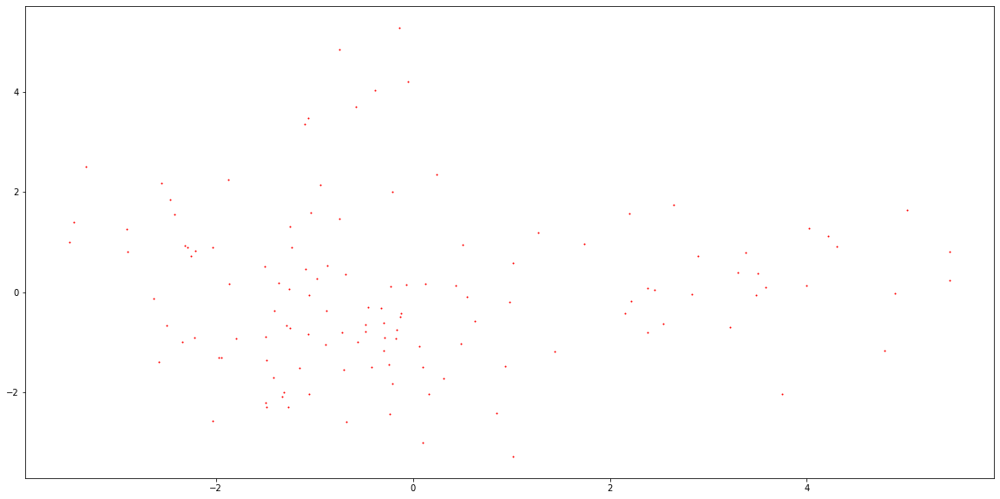

In [ ]:
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA

#sampling the model_df population
pca_df = model_df.reset_index()
pca_df = model_df.dropna(axis=0).iloc[:,1:]
pca_df = pca_df.iloc[::50]

#setting up PCA
pca = PCA(n_components=2, random_state=42)
pca = pca.fit_transform(pca_df.iloc[:, :-1])
labels = pca_df["label"]

#setting up plot components
x_axis = pca[:,0]
y_axis = pca[:,1]
#

#plotting PCA
f, axes = plt.subplots(figsize=(20,10))
plt.scatter(x_axis, y_axis, color='red', s=1)
plt.show()


#More on Word2Vec

In [ ]:
word_bank = ["nook", "phone", "tv", "good", "price" ]

for word in word_bank[:]:
    related_vec = word_vec.wv.most_similar(word, topn=5)
    related_words = np.array(related_vec)[:,0]
    word_bank.extend(related_words)
    print(f"{word}: {related_words}")

nook: ['curve' 'purse' 'iradar' 'detection' 'cobra']
phone: ['gadgetoverload' 'cell' 'laptop' 'marketshare' 'mobilefarm']
tv: ['petricone' 'library' 'overdrive' 'headphones' 'bitrate']
good: ['ridic' 'closed' 'conquer' 'handwriting' 'eminent']
price: ['doom' 'banana' 'triple' 'buck' 'pork']


#TSNE

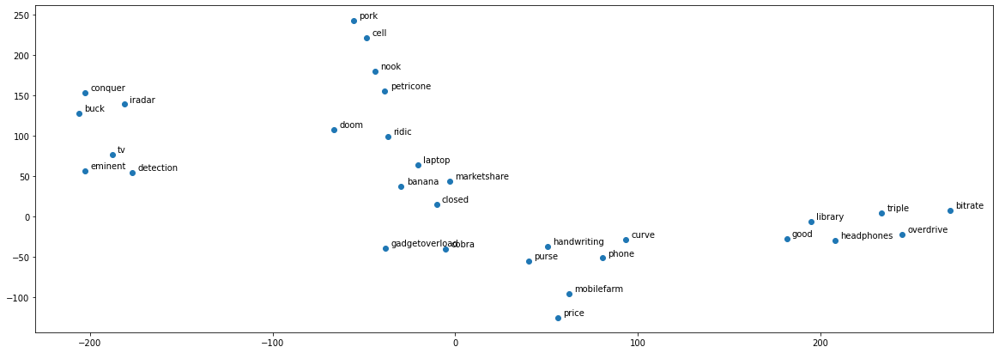

In [ ]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=5, n_iter=1000, random_state=42)

sample_vecs = word_vec.wv[set(word_bank)]
sample_tsne = tsne.fit_transform(sample_vecs)
tsne_x = sample_tsne[:, 0]
tsne_y = sample_tsne[:, 1]

f, axes = plt.subplots(figsize=(20,7))
ax = plt.scatter(x=tsne_x, y=tsne_y)

for label, x, y in zip(word_bank, tsne_x, tsne_y):
    plt.annotate(label, xy=(x+3, y+3))

plt.show()

In [ ]:
helpful = dataset["Product_Description"].tolist()
most_helpful = max(helpful, key=lambda x: x[0])

most_helpful_idx = dataset["Product_Description"].astype(str) == str(most_helpful)
most_helpful_idx = dataset[most_helpful_idx].index

most_helpful_text = dataset["Product_Description"].iloc[most_helpful_idx].values[0]

print(most_helpful_text)

Ï¡Ïàü_ÊÎÒ£Áââ_£â_ÛâRT @mention Google Tests ÛÏCheck-in OffersÛ At #SXSW {link}


In [ ]:
%%time
import spacy

from collections import defaultdict

ner = spacy.load("en_core_web_sm")

ner_helpful = ner(most_helpful_text)

ner_dict = defaultdict(list)
for entity in ner_helpful.ents:
    ner_dict[entity.label_].append(entity)

for NER, name in ner_dict.items():
    print(f"{NER}:\n{name}\n")

/usr/local/lib/python3.8/dist-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


NameError: ignored

In [ ]:
#Topic Modeling
%%time
import multiprocessing

from gensim.models.ldamulticore import LdaMulticore

cores = multiprocessing.cpu_count()

num_topics = 10
bow_lda = LdaMulticore(bow, num_topics=num_topics, id2word=vocabulary, \
                       passes=5, workers=cores, random_state=42)

for token, frequency in bow_lda.show_topic(0, topn=5):
    print(token, frequency)

sxsw 0.077700615
mention 0.072353736
google 0.026392974
link 0.020493442
rt 0.02041313
CPU times: user 12.8 s, sys: 892 ms, total: 13.7 s
Wall time: 19.9 s


In [ ]:
for topic in range(0, num_topics):
    print(f"\nTopic {topic+1}:")
    for token, frequency in bow_lda.show_topic(topic, topn=5):
        print(f" {token}, {frequency}")


Topic 1:
 sxsw, 0.07770061492919922
 mention, 0.07235373556613922
 google, 0.026392973959445953
 link, 0.020493442192673683
 rt, 0.020413130521774292

Topic 2:
 quot, 0.12300223112106323
 sxsw, 0.0650540217757225
 mention, 0.05082644522190094
 rt, 0.02735074982047081
 ipad, 0.02650207281112671

Topic 3:
 sxsw, 0.08489825576543808
 mention, 0.04339415207505226
 link, 0.033049728721380234
 ipad, 0.0256270132958889
 iphone, 0.02016020007431507

Topic 4:
 sxsw, 0.07847371697425842
 ipad, 0.0505937896668911
 link, 0.024655209854245186
 mention, 0.015613713301718235
 rt, 0.01195502933114767

Topic 5:
 sxsw, 0.0713832899928093
 mention, 0.04317871481180191
 link, 0.022232182323932648
 apple, 0.02153851091861725
 rt, 0.017907176166772842

Topic 6:
 sxsw, 0.07960116118192673
 google, 0.06610702723264694
 link, 0.03971268609166145
 mention, 0.03704147785902023
 amp, 0.018441293388605118

Topic 7:
 sxsw, 0.09584033489227295
 apple, 0.09143325686454773
 store, 0.055029112845659256
 link, 0.044125

PART 4

In [ ]:
# Import Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import string
import spacy

from matplotlib.pyplot import imread
from wordcloud import WordCloud, STOPWORDS
%matplotlib inline

In [ ]:
import pandas as pd
import io
 
data = pd.read_csv(io.BytesIO(uploaded[r'Product_details - Copy.csv']))


data=[Product_Description.strip() for Product_Description in data.Product_Description] # remove both the leading and the trailing characters
data=[Product_Description for Product_Description in data if Product_Description] # removes empty strings, because they are considered in Python as False
data[0:10]



NameError: ignored

In [ ]:
#data=pd.read_csv(r'C:\Users\hp\Desktop\ExcelR\Project\Session 1\Day 1\Product_details - Copy.csv',encoding='Latin-1')
print(data.tail(10))

AttributeError: ignored

In [ ]:
data=pd.read_csv(r'C:\Users\hp\Desktop\ExcelR\Project\Session 1\Day 1\Product_details - Copy.csv',encoding='Latin-1')
print(data.head(10))

FileNotFoundError: ignored

In [ ]:
data.info()

NameError: ignored

In [ ]:
data.describe([0.05, 0.10, 0.25, 0.50, 0.75, 0.80, 0.90, 0.95, 0.99]).T

In [ ]:
data.describe()

In [ ]:
#Removed The Spaces
pattern = r"[\s]+"

data["preprocessed"] = data["Product_Description"].str.replace(pat=pattern, repl=" ", regex=True)

print(data["preprocessed"])

NameError: ignored

In [ ]:
# Joining the list into one string/text
data_Product_Description=' '.join(data)
data_Product_Description

NameError: ignored

In [ ]:
# remove username handles from a given Amazon Data text. (Removes @usernames)
from nltk.tokenize import TweetTokenizer
tknzr = TweetTokenizer(strip_handles=True)
Data_tokens=tknzr.tokenize(data_Product_Description)
print(Data_tokens)


In [ ]:

# Again Joining the list into one string/text
data_Product_Description=' '.join(Data_tokens)
data_Product_Description



NameError: ignored

In [ ]:
# Remove Punctuations 
no_punc_text=data_Product_Description.translate(str.maketrans('','',string.punctuation))
no_punc_text

NameError: ignored

In [ ]:
# remove https or url within text
import re
no_url_text=re.sub(r'http\S+', '', no_punc_text)
no_url_text


In [ ]:
len(no_url_text)

In [ ]:
# Normalize the data
lower_words=[Text.lower() for Text in no_url_text]
print(lower_words[100:200])



In [ ]:
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.axis('off')



In [ ]:
# Generate Word Cloud

STOPWORDS.add('pron')
STOPWORDS.add('rt')
STOPWORDS.add('yeah')
wordcloud=WordCloud(width=3000,height=2000,background_color='black',max_words=150,
                   colormap='Set1',stopwords=STOPWORDS).generate(data_Product_Description)
plot_cloud(wordcloud)


In [ ]:
# negative Word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(20, 10))
    plt.imshow(wordcloud)  
    plt.axis("off");
    
# Generate & plot wordcloud
wordcloud=WordCloud(width=2000,height=1000,background_color="black",max_words=150,
                    colormap="Set1").generate(" ".join(data[data["Sentiment"]<2].Product_Description))
plot_cloud(wordcloud);

In [ ]:
# Positive Word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(20, 10))
    plt.imshow(wordcloud)  
    plt.axis("off");
    
# Generate & plot wordcloud
wordcloud=WordCloud(width=2000,height=1000,background_color="black",max_words=150,
                    colormap="Set1").generate(" ".join(data[data["Sentiment"]>2].Product_Description))
plot_cloud(wordcloud);

In [ ]:
import collections
import numpy as np
import pandas as pd
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from matplotlib import rcParams
from wordcloud import WordCloud, STOPWORDS
%matplotlib inline

In [ ]:
dataset = pd.read_csv(r'C:\Users\hp\Desktop\ExcelR\Project\Session 1\Day 1\Product_details - Copy.csv',encoding='Latin-1')
dataset.columns

In [ ]:
all_Product_Description = ' '.join(dataset['Product_Description'].str.lower())

In [ ]:
stopwords = STOPWORDS
stopwords.add('will')

wordcloud = WordCloud(stopwords=stopwords, background_color="white", max_words=1000).generate(all_Product_Description)

In [ ]:

rcParams['figure.figsize'] = 10, 20
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [ ]:
filtered_words = [word for word in all_Product_Description.split() if word not in stopwords]
counted_words = collections.Counter(filtered_words)

words = []
counts = []
for letter, count in counted_words.most_common(10):
    words.append(letter)
    counts.append(count)

In [ ]:
colors = cm.rainbow(np.linspace(0, 1, 10))
rcParams['figure.figsize'] = 20, 10

plt.title('Top words in the Product Description vs their count')
plt.xlabel('Count')
plt.ylabel('Words')
plt.barh(words, counts, color=colors)

In [ ]:
## Import data visualization packages
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
data=pd.read_csv(r'C:\Users\hp\Desktop\ExcelR\Project\Session 1\Day 1\Product_details - Copy.csv',encoding='Latin-1')
plt.barh("Product_Type", "Sentiment", data = data, color = "blue")
plt.xlabel("Sentiment Scored")
plt.ylabel("Product_type")
#plt.title("Highest goal scorers in the Premier league 2019-20 by mid-season")
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
data=pd.read_csv(r'C:\Users\hp\Desktop\ExcelR\Project\Session 1\Day 1\Product_details - Copy.csv',encoding='Latin-1')
data.plot.kde

In [ ]:
data=pd.read_csv(r'C:\Users\hp\Desktop\ExcelR\Project\Session 1\Day 1\Product_details - Copy.csv',encoding='Latin-1')
plt.barh("Product_Type", "Text_ID", data = data, color = "blue")
plt.xlabel("Text_ID")
plt.ylabel("Product_type")
#plt.title("Highest goal scorers in the Premier league 2019-20 by mid-season")
plt.show()

In [ ]:
data=pd.read_csv(r'C:\Users\hp\Desktop\ExcelR\Project\Session 1\Day 1\Product_details - Copy.csv',encoding='Latin-1')
plt.barh("Sentiment", "Text_ID", data = data, color = "blue")
plt.xlabel("Text_ID")
plt.ylabel("Sentiment")
#plt.title("Highest goal scorers in the Premier league 2019-20 by mid-season")
plt.show()

In [ ]:
import seaborn as sns
data=pd.read_csv(r'C:\Users\hp\Desktop\ExcelR\Project\Session 1\Day 1\Product_details - Copy.csv',encoding='Latin-1')
data.corr()
#Product_Type increases/Sentiment decreases means Negative Correlation
#Product_Type increases/Text ID increases means Positive Correlation

In [ ]:
sns.heatmap(data.corr())

In [ ]:
sns.distplot(data.corr())

In [ ]:
sns.pairplot(data.corr())

In [ ]:
sns.jointplot(data.corr())

In [ ]:
data=pd.read_csv(r'C:\Users\hp\Desktop\ExcelR\Project\Session 1\Day 1\Product_details - Copy.csv',encoding='Latin-1')
data.mean()

In [ ]:
sns.pairplot(data)

#producttype 4 can be treated as a product which recieves very less reviews as Mean of product_type is 7 and as shown in the Pairplot Analysis.

In [ ]:
import pandas as pd
data=pd.read_csv(r'C:\Users\hp\Desktop\ExcelR\Project\Session 1\Day 1\Product_details - Copy.csv',encoding='Latin-1')
data

In [ ]:
gk = data.groupby('Product_Type')
  
# Let's print the first entries
# in all the groups formed.
gk.first()

In [ ]:
gk.get_group(0)

In [ ]:
gk.get_group(0)['Sentiment'].value_counts()

#producttype 0 has good reviews and has 9% negative reviews

In [ ]:
gk.get_group(1)

In [ ]:
gk.get_group(1)['Sentiment'].value_counts()

#producttype 1 has good reviews and 10% negative reviews

In [ ]:
gk.get_group(2)

In [ ]:
gk.get_group(2)['Sentiment'].value_counts()

#producttype 2 has 18% negative reviews

In [ ]:
gk.get_group(3)

In [ ]:
gk.get_group(3)['Sentiment'].value_counts()

#producttype 3 has 23% negative reviews

In [ ]:
gk.get_group(4)

In [ ]:
gk.get_group(4)['Sentiment'].value_counts()

#producttype 4 has good reviews

In [ ]:
gk.get_group(5)

In [ ]:
gk.get_group(5)['Sentiment'].value_counts()

#producttype 5 has good reviews and 19% negative reviews

In [ ]:
gk.get_group(6)

In [ ]:
gk.get_group(6)['Sentiment'].value_counts()

#producttype 6 has good reviews and 16% negative review

In [ ]:
gk.get_group(7)

In [ ]:
gk.get_group(7)['Sentiment'].value_counts()

#producttype 7 has good reviews and 15% negative reviews

In [ ]:
gk.get_group(8)

In [ ]:
gk.get_group(8)['Sentiment'].value_counts()

#producttype 8 has good reviews and 37% negative reviews

In [ ]:
gk.get_group(9)

In [ ]:
gk.get_group(9)['Sentiment'].value_counts()

#producttype 9 has good reviews and has 9% negative reviews

In [ ]:
# importing pandas as pd
import pandas as pd
  
# Creating the dataframe 
data=pd.read_csv(r'C:\Users\hp\Desktop\ExcelR\Project\Session 1\Day 1\Product_details - Copy.csv',encoding='Latin-1')
  
# First grouping based on "Team"
# Within each team we are grouping based on "Position"
gkk = data.groupby(['Product_Type', 'Sentiment'])
  
# Print the first value in each group
gkk.first()


In [ ]:
gkk.head(10)

In [ ]:
gkk= data.groupby(['Product_Type', 'Sentiment'])
gkk.count()

In [ ]:
data=pd.read_csv(r'C:\Users\hp\Desktop\ExcelR\Project\Session 1\Day 1\Product_details - Copy.csv',encoding='Latin-1')
data.std()

In [ ]:
from nltk.tokenize import TweetTokenizer
tknzr = TweetTokenizer(strip_handles=True)
Data_tokens=tknzr.tokenize(data_Product_Description)
print(Data_tokens)


In [ ]:
dataset = Data_tokens

# be sure to split sentence before feed into Dictionary
dataset = [d.split() for d in dataset]


from gensim.corpora.dictionary import Dictionary

vocabulary = Dictionary(dataset)

vocabulary_keys = list(vocabulary.token2id)[0:100]

for key in vocabulary_keys:
    print(f"ID: {vocabulary.token2id[key]}, Token: {key}")

In [ ]:
bow = [vocabulary.doc2bow(doc) for doc in dataset]

for idx, freq in bow[0]:
    print(f"Word: {vocabulary.get(idx)}, Frequency: {freq}")


In [ ]:
from gensim.models.tfidfmodel import TfidfModel

tfidf = TfidfModel(bow)

for idx, weight in tfidf[bow[0]]:
    print(f"Word: {vocabulary.get(idx)}, Weight: {weight:.3f}")

In [ ]:
from gensim.models.tfidfmodel import TfidfModel

tfidf = TfidfModel(bow)

for idx, weight in tfidf[bow[0]]:
    print(f"Word: {vocabulary.get(idx)}, Weight: {weight:.3f}")

In [ ]:
dataset = Data_tokens

# be sure to split sentence before feed into Dictionary
dataset = [d.split() for d in dataset]

bow = [vocabulary.doc2bow(doc) for doc in dataset]

for idx, freq in bow[3]:
    print(f"Word: {vocabulary.get(idx)}, Frequency: {freq}")

In [ ]:

from gensim.models.tfidfmodel import TfidfModel

tfidf = TfidfModel(bow)

for idx, weight in tfidf[bow[0]]:
    print(f"Word: {vocabulary.get(idx)}, Weight: {weight:.3f}")

In [ ]:
%%time
import numpy as np

from gensim.models import word2vec

np.set_printoptions(suppress=True)

feature_size = 100
context_size = 20
min_word = 1

word_vec= word2vec.Word2Vec(dataset)

In [ ]:
import seaborn as sns
data=pd.read_csv(r'C:\Users\hp\Desktop\ExcelR\Project\Session 1\Day 1\Product_details - Copy.csv',encoding='Latin-1')

f, axes = plt.subplots(figsize=(20,7))
ax = sns.countplot(x=data["Sentiment"], palette="OrRd_r")
ax.set(title="Distribution of Product Ratings", \
       xlabel="Sentiment", ylabel="Number of Reviews")
plt.show()

In [ ]:
import seaborn as sns
data=pd.read_csv(r'C:\Users\hp\Desktop\ExcelR\Project\Session 1\Day 1\Product_details - Copy.csv',encoding='Latin-1')

f, axes = plt.subplots(figsize=(20,7))
ax = sns.countplot(x=data["Product_Type"], palette="OrRd_r")
ax.set(title="Distribution of Product Ratings", \
           xlabel="Product_Type", ylabel="Number of Reviews")
plt.show()

In [ ]:
import seaborn as sns
data=pd.read_csv(r'C:\Users\hp\Desktop\ExcelR\Project\Session 1\Day 1\Product_details - Copy.csv',encoding='Latin-1')
import pandas as pd
# Define a list of models that we want to review
models = ["Sentiment","Product_Type"]

In [ ]:
pd.crosstab(data.Sentiment, data.Product_Type)

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
d=pd.crosstab(data.Sentiment, data.Product_Type)
sns.distplot(d)

In [ ]:
# importing the libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
  
# loading the dataset
# from seaborn library
data=pd.read_csv(r'C:\Users\hp\Desktop\ExcelR\Project\Session 1\Day 1\Product_details - Copy.csv',encoding='Latin-1')
  
# viewing the dataset
print(data.head(4))

In [ ]:
# plotting the density plot 
# for 'speeding' attribute
# using plot.density()
data.Sentiment.plot.density(color='green')
plt.title('Density plot for Sentiment')
plt.show()

In [ ]:
# plotting the density plot 
# for 'speeding' attribute
# using plot.density()
data.Product_Type.plot.density(color='green')
plt.title('Density plot for Product_Type')
plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.heatmap(pd.crosstab(data.Sentiment, data.Product_Type))

In [ ]:
from sklearn.model_selection import train_test_split
data=pd.read_csv(r'C:\Users\hp\Desktop\ExcelR\Project\Session 1\Day 1\Product_details - Copy.csv',encoding='Latin-1')
  

X = data.iloc[:, :-1]
y = data.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.5, random_state=42)

import numpy as np
from sklearn import metrics

label_shape = np.shape(y_test)
y_baseline = np.full(label_shape, 5)

accuracy_baseline = metrics.accuracy_score(y_test, y_baseline)
f1_score_baseline = metrics.f1_score(y_test, y_baseline, average="micro")

print(f"Baseline Accuracy: {accuracy_baseline*100:.3f}%")
print(f"Baseline F1 Score: {f1_score_baseline:.3f}")


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
data=pd.read_csv(r'C:\Users\hp\Desktop\ExcelR\Project\Session 1\Day 1\Product_details - Copy.csv',encoding='Latin-1')

In [ ]:

data['Product_Type'].hist()

In [ ]:

data['Sentiment'].hist()

In [ ]:

data['Sentiment'].value_counts()

In [ ]:

data['Product_Type'].value_counts()